## Training a Positive Naive Bayes Classifier on GPS-like Signals

# Import Statements

In [1]:
import fitsio as fio
import matplotlib.pyplot as plt
import numpy as np
import nltk
import pandas as pd
import pickle
import random
import os

from nltk.classify import PositiveNaiveBayesClassifier
from __future__ import division

# Functions and Constants

In [2]:
fits_data_loc = "/Users/mulan/desktop/fits_data/"
wrong_label = []
error = []

def plot_name(x):
    """ Plot ON/OFF pair by name. """
    on_plt = fio.read(fits_data_loc + x + ".fits")
    off_plt = fio.read(fits_data_loc + x + "_OFF.fits")
    vmax = max([np.max(on_plt), np.max(off_plt)])
    vmin = min([np.min(on_plt), np.min(off_plt)])
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,4), sharex=True, sharey=True)
    ax1.imshow(on_plt, aspect=15, vmax=vmax, vmin=vmin, cmap = "viridis")
    ax1.set_adjustable('box-forced')
    ax1.set_title('ON image')
    ax2.imshow(off_plt, aspect=15, vmax=vmax, vmin=vmin, cmap = "viridis")
    ax2.set_adjustable('box-forced')
    ax2.set_title('OFF image')
    f.suptitle(x) 
    plt.show()

### Load in Dataframe

In [3]:
df = pd.read_pickle('dataframe.pkl')
df = df.loc[:,~df.columns.duplicated()]
del df['star']

### Add GPS labels

In [4]:
df['GPS'] = pd.Series(np.full((df.shape[0],), 1), index=df.index)
targ0_no_OFF = np.load('targ0_no_OFF.npy')
targ1_no_OFF = np.load('targ1_no_OFF.npy')
targ2_no_OFF = np.load('targ2_no_OFF.npy')

df.loc[targ0_no_OFF, 'GPS'] = -1
df.loc[targ1_no_OFF, 'GPS'] = -1
df.loc[targ2_no_OFF, 'GPS'] = -1

### Seperate into training, validation and testing groups

In [5]:
train, validate, test = np.split(df.sample(frac=1), [int(.6*len(df)), int(.8*len(df))])
print("train = " + str(train.shape[0]))
print("validate = " + str(validate.shape[0]))
print("test = " + str(test.shape[0]))

train = 28345
validate = 9448
test = 9449


## <font color='blue'> Training Set</font>
### Get Signals

In [6]:
GPS_signals = train.loc[df['GPS'] == -1]
unlabelled_signals = train.loc[df['GPS'] == 1]

del GPS_signals['GPS']
del unlabelled_signals['GPS']

In [7]:
GPS_signal_names = GPS_signals.index.tolist()
GPS_signal_dict = GPS_signals.T.to_dict()
positive_featuresets = [GPS_signal_dict[x] for x in GPS_signals.index.tolist()]


unlabelled_names = unlabelled_signals.index.tolist()
unlabelled_dict = unlabelled_signals.T.to_dict()
unlabeled_featuresets = [unlabelled_dict[x] for x in unlabelled_signals.index.tolist()]


### Train a Classifier


In [8]:
classifier = PositiveNaiveBayesClassifier.train(positive_featuresets,
                                                 unlabeled_featuresets,
                                                positive_prob_prior = 0.0005)


In [47]:
for x in range(len(unlabeled_featuresets)):
    if classifier.classify(unlabeled_featuresets[x]):
        wrong_label.append(unlabelled_names[x])
print(len(wrong_label))

16


index: 0


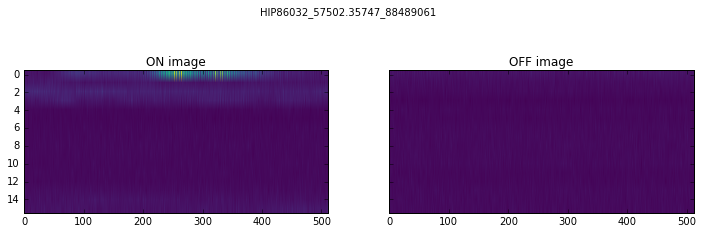

index: 1


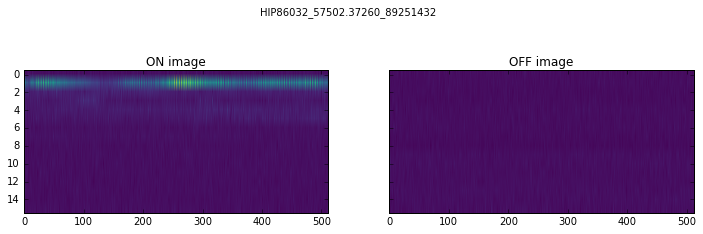

index: 2


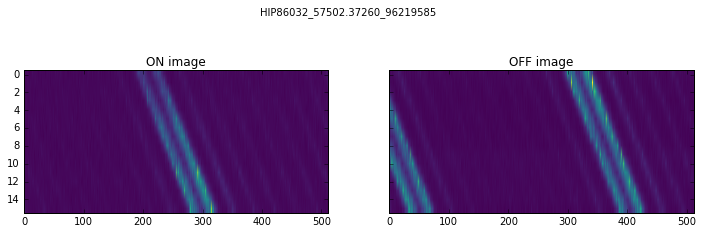

index: 3


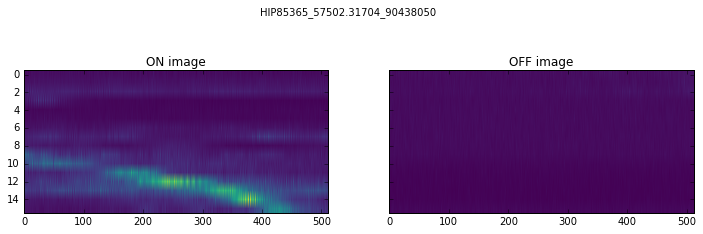

index: 4


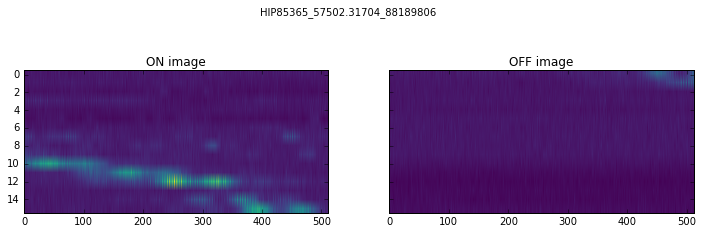

index: 5


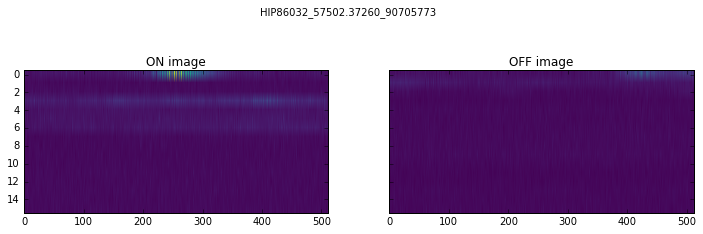

index: 6


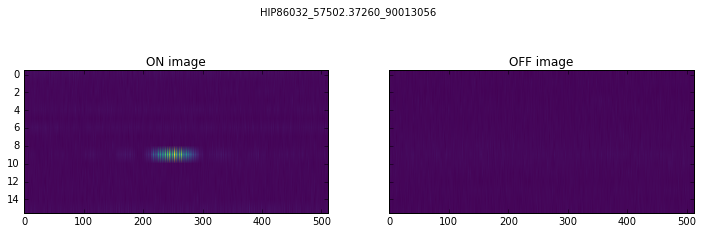

index: 7


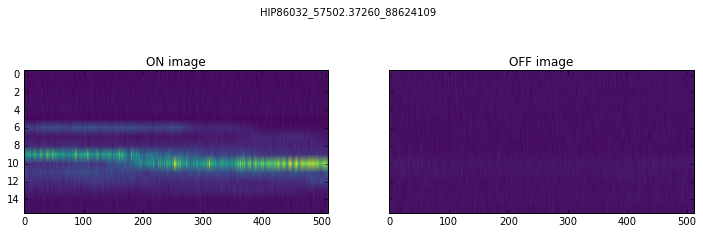

index: 8


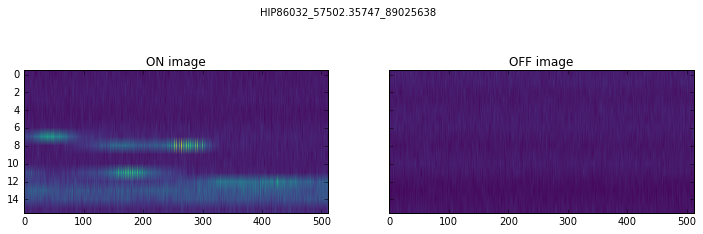

index: 9


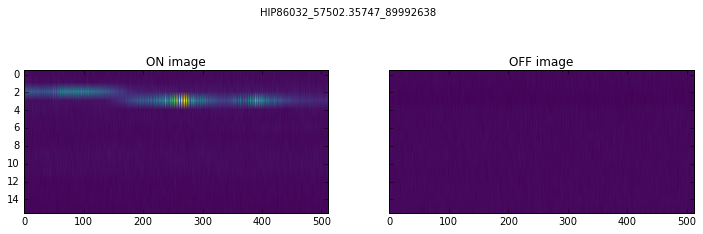

index: 10


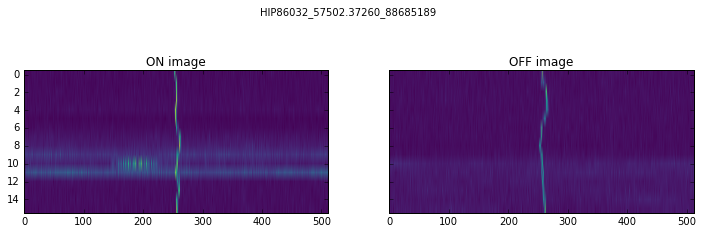

index: 11


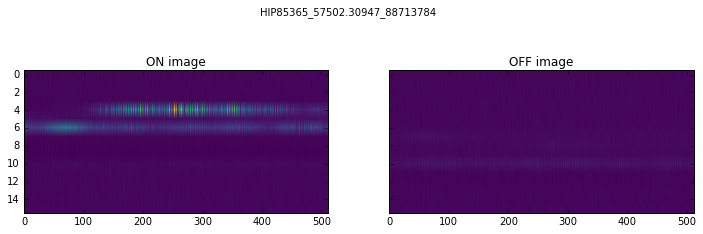

index: 12


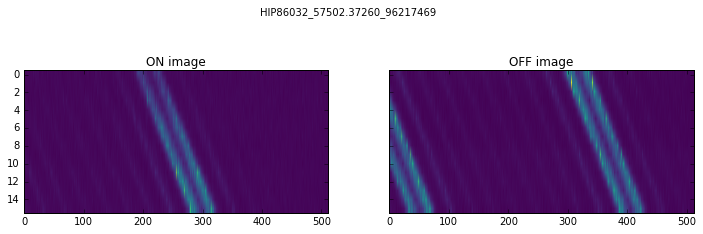

index: 13


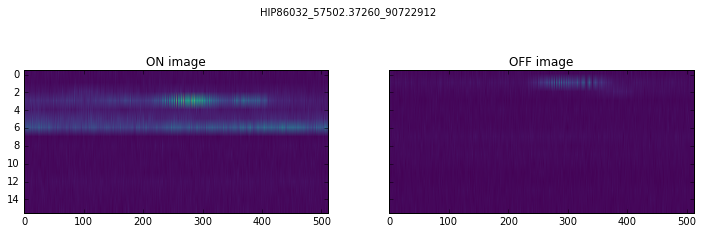

index: 14


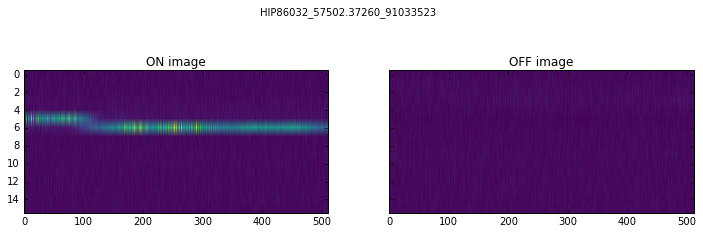

index: 15


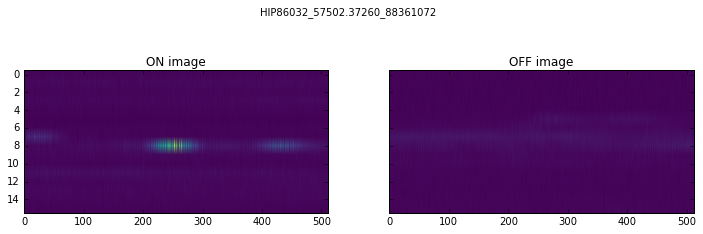

In [48]:
for a, x in enumerate(wrong_label):
    print("index: " + str(a))
    plot_name(x)

index: 0


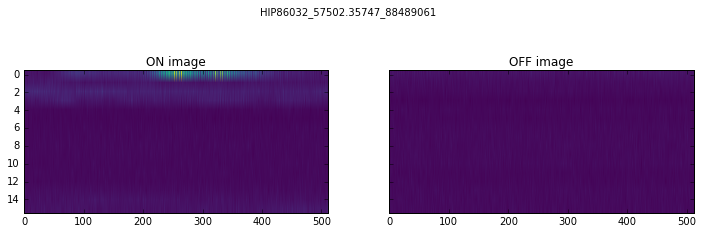

index: 1


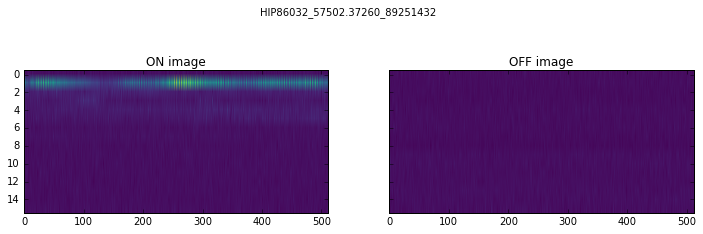

index: 2


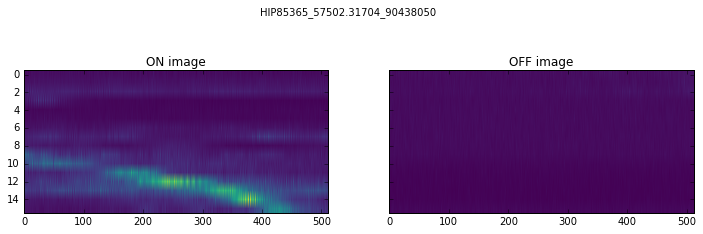

index: 3


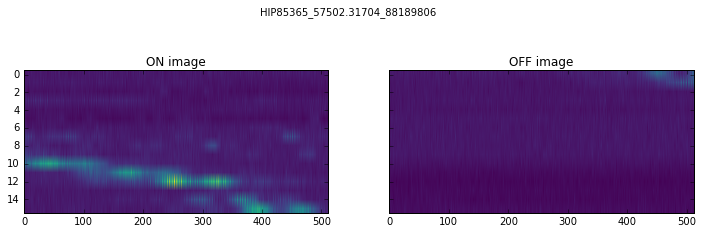

index: 4


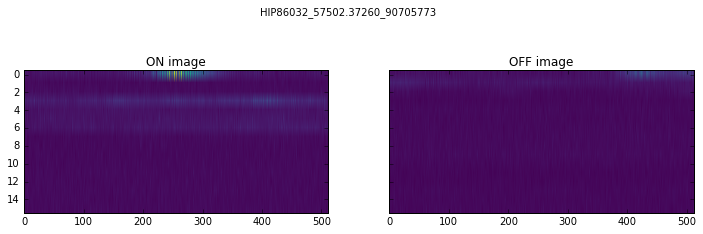

index: 5


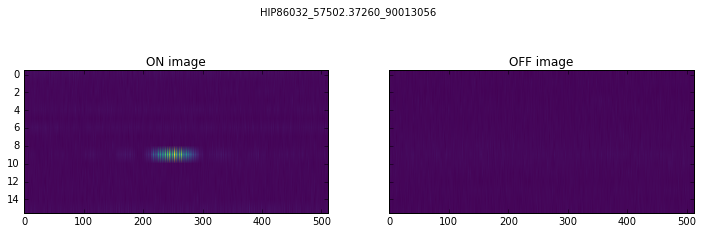

index: 6


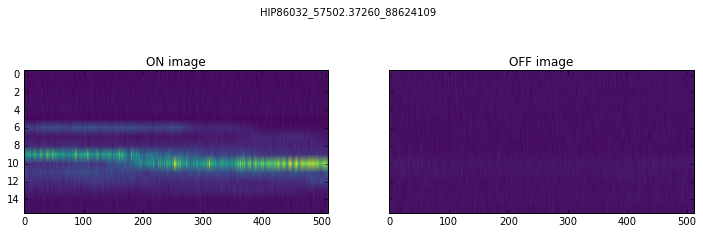

index: 7


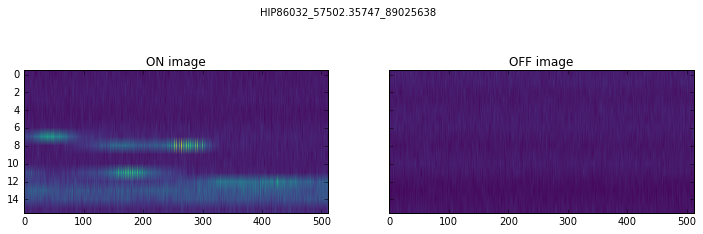

index: 8


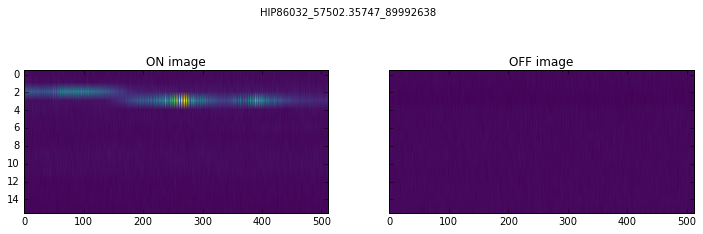

index: 9


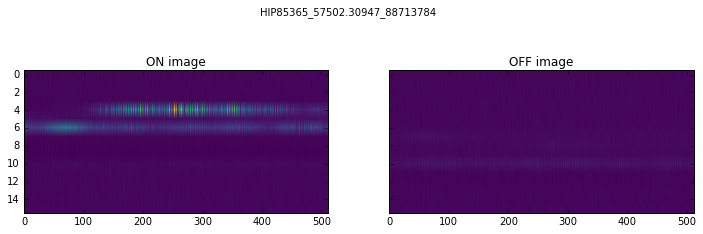

index: 10


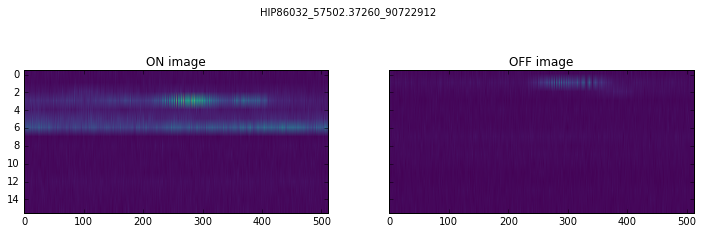

index: 11


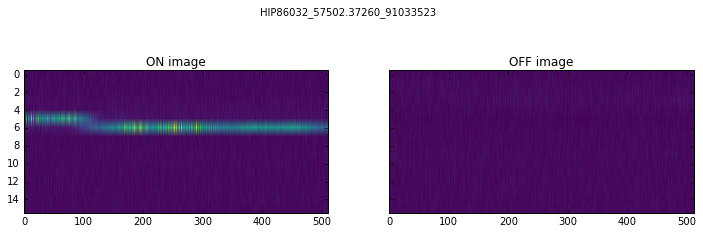

index: 12


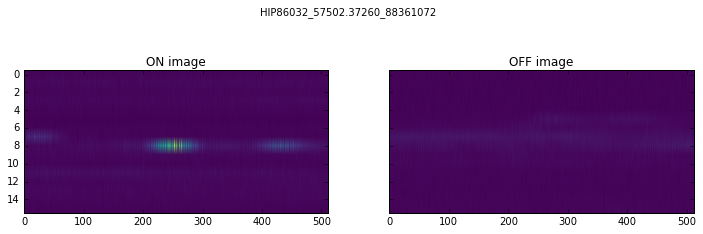

In [49]:
wrong_label = [v for i,v in enumerate(wrong_label) if i not in frozenset((2, 10, 12))] 
for a, x in enumerate(wrong_label):
    print("index: " + str(a))
    plot_name(x)

## <font color='blue'> Validation Set</font>
### Get Signals

In [11]:
validate_GPS_signals = validate.loc[df['GPS'] == -1]
validate_unlabelled_signals = validate.loc[df['GPS'] == 1]

del validate_GPS_signals['GPS']
del validate_unlabelled_signals['GPS']

In [12]:
validate_GPS_names = validate_GPS_signals.index.tolist()
validate_GPS_dict = validate_GPS_signals.T.to_dict()
validate_GPS_featuresets = [validate_GPS_dict[x] for x in validate_GPS_names]

validate_unlabelled_names = validate_unlabelled_signals.index.tolist()
validate_unlabelled_dict = validate_unlabelled_signals.T.to_dict()
validate_unlabeled_featuresets = [validate_unlabelled_dict[x] for x in validate_unlabelled_names]


### Train a Classifier

In [50]:
classifier = PositiveNaiveBayesClassifier.train(validate_GPS_featuresets,
                                                 validate_unlabeled_featuresets,
                                                positive_prob_prior = 0.0005)


In [51]:
for x in range(len(validate_unlabeled_featuresets)):
    if classifier.classify(validate_unlabeled_featuresets[x]):
        wrong_label.append(validate_unlabelled_names[x])
print(len(wrong_label))

17


index: 0


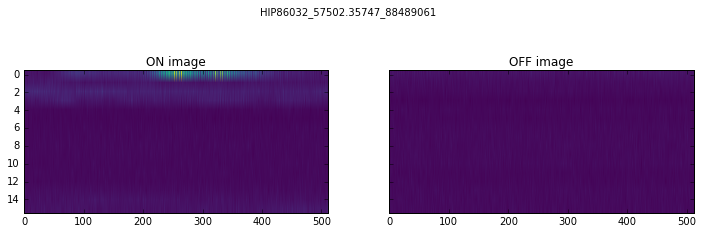

index: 1


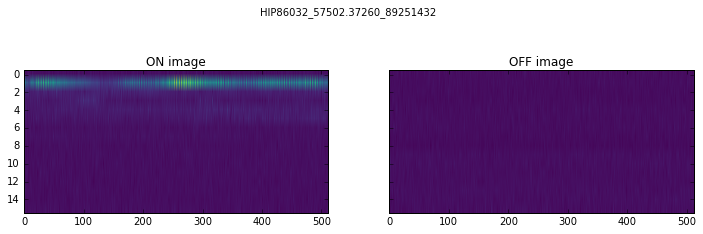

index: 2


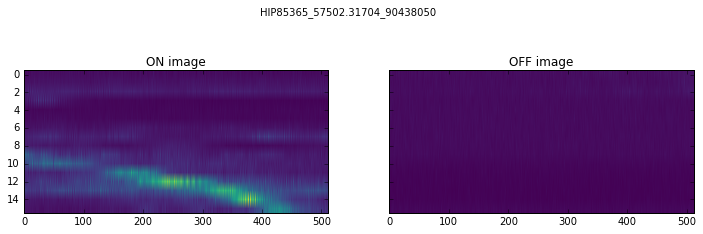

index: 3


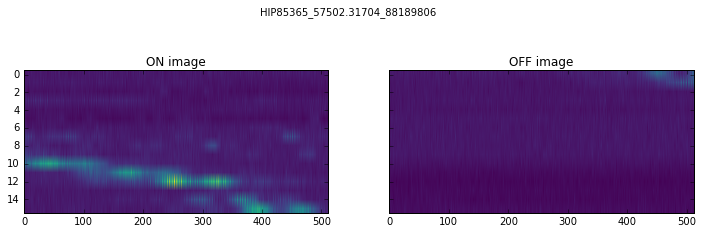

index: 4


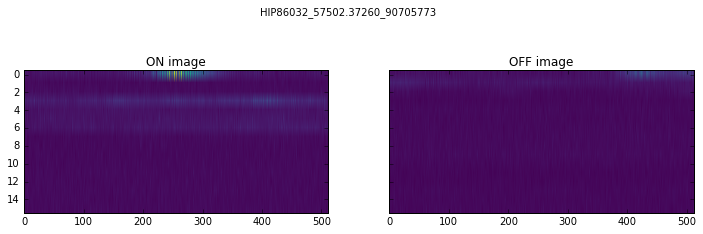

index: 5


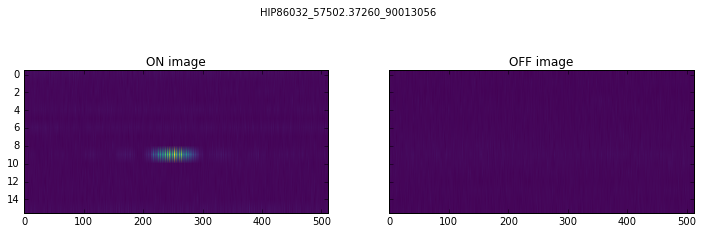

index: 6


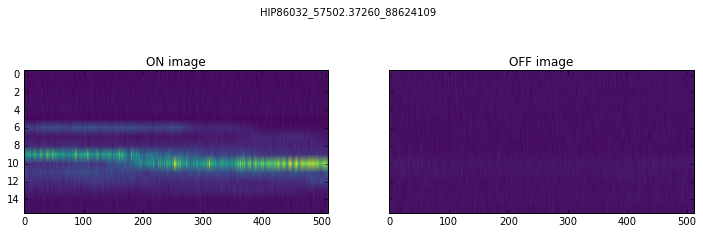

index: 7


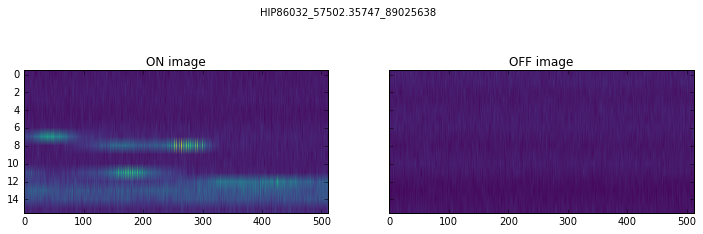

index: 8


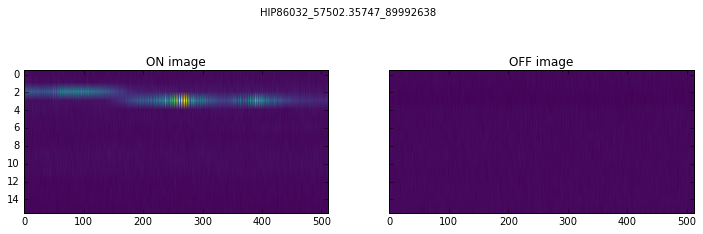

index: 9


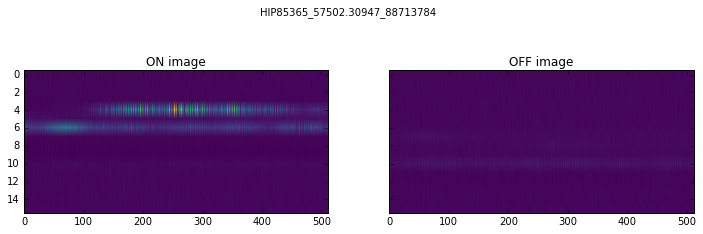

index: 10


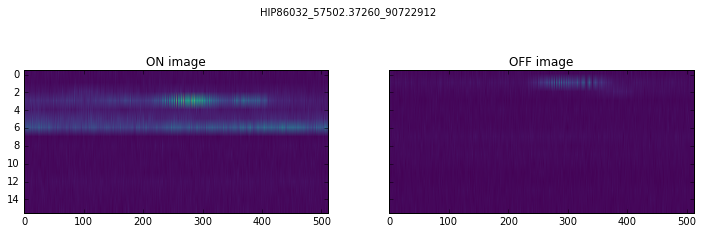

index: 11


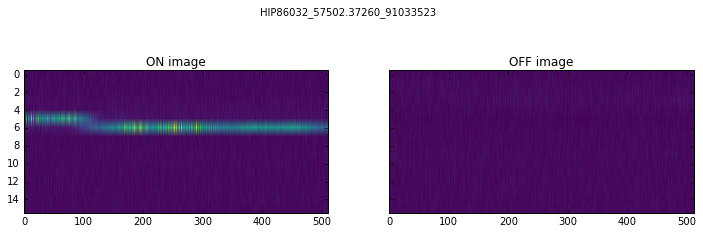

index: 12


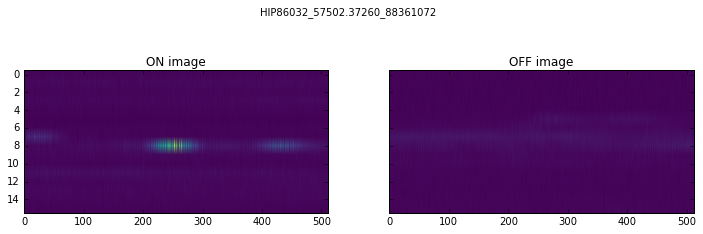

index: 13


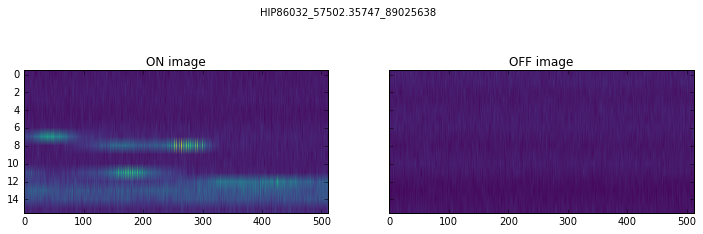

index: 14


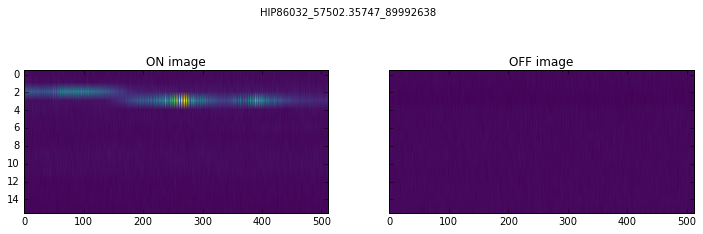

index: 15


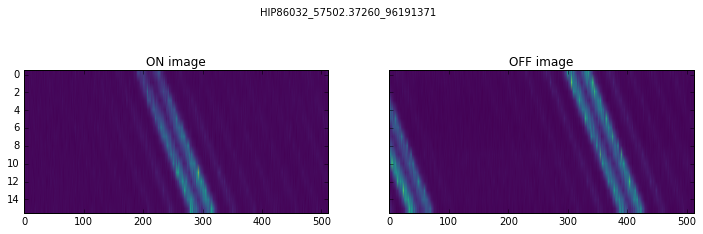

index: 16


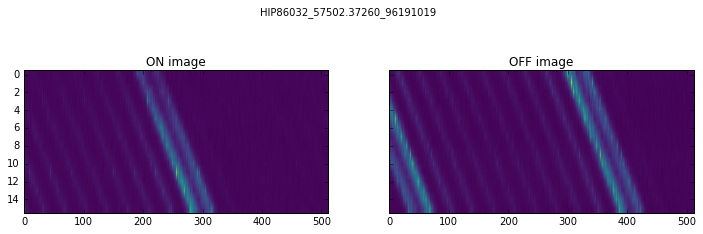

In [52]:
for a, x in enumerate(wrong_label):
    print("index: " + str(a))
    plot_name(x)

index: 0


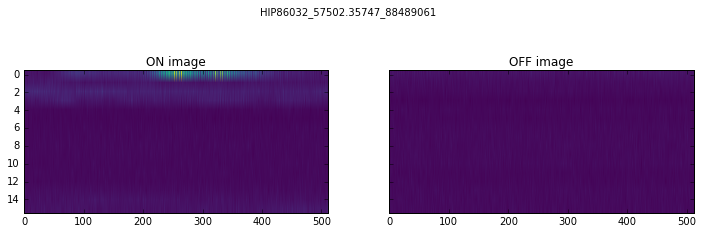

index: 1


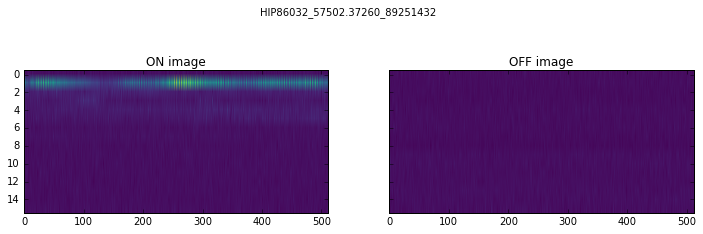

index: 2


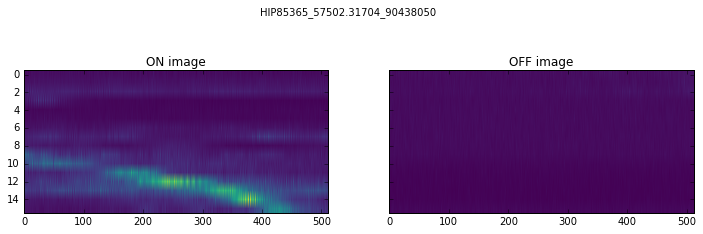

index: 3


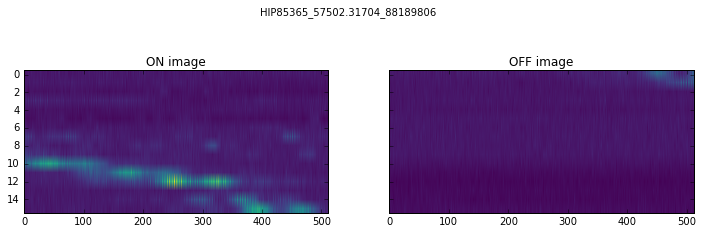

index: 4


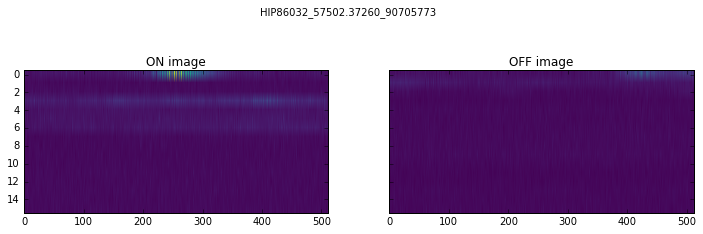

index: 5


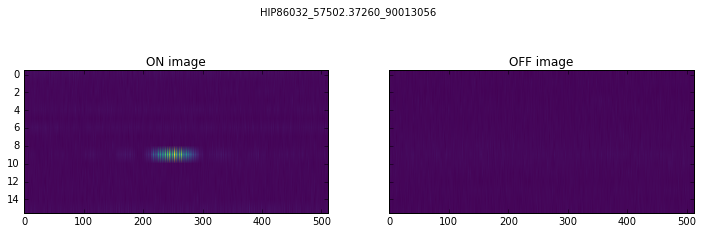

index: 6


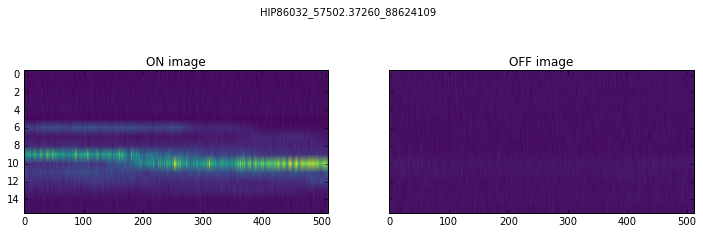

index: 7


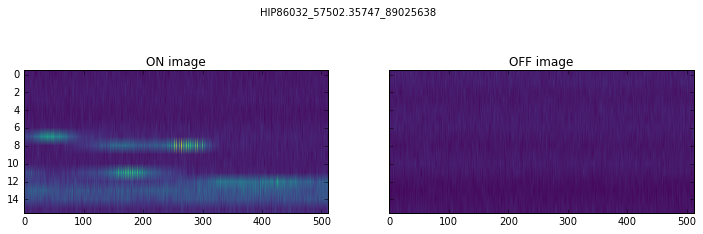

index: 8


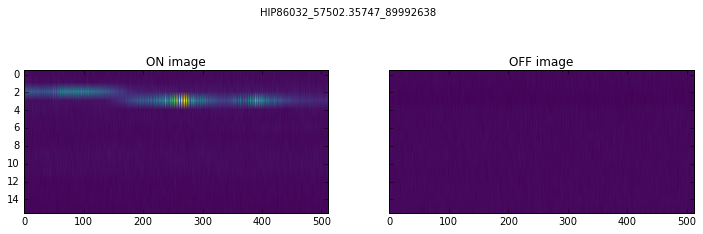

index: 9


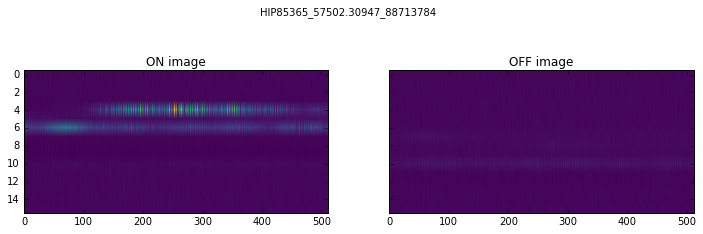

index: 10


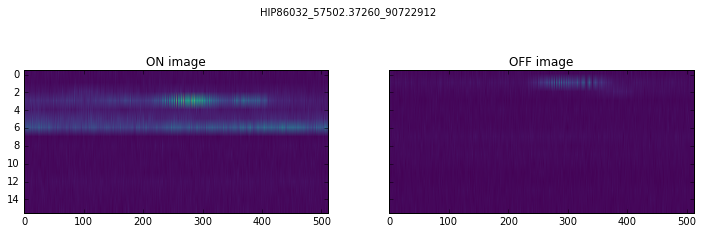

index: 11


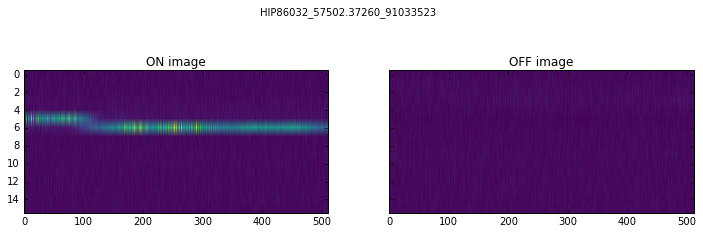

index: 12


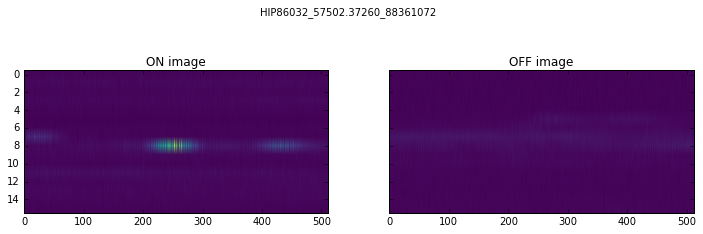

index: 13


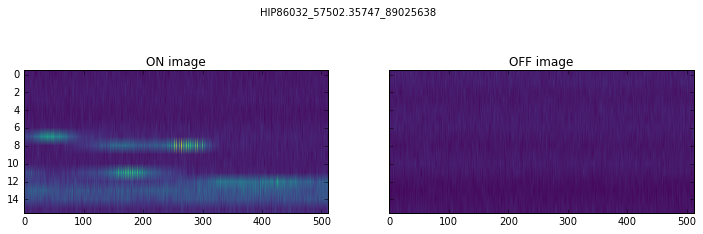

index: 14


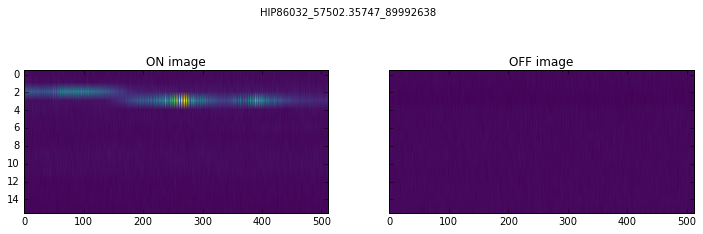

In [53]:
wrong_label = [v for i,v in enumerate(wrong_label) if i not in frozenset((15, 16))] 
for a, x in enumerate(wrong_label):
    print("index: " + str(a))
    plot_name(x)

## <font color='blue'> Test Set</font>
### Get Signals

In [15]:
test_GPS_signals = test.loc[df['GPS'] == -1]
test_unlabelled_signals = test.loc[df['GPS'] == 1]

del test_GPS_signals['GPS']
del test_unlabelled_signals['GPS']

In [16]:
test_GPS_names = test_GPS_signals.index.tolist()
test_GPS_dict = test_GPS_signals.T.to_dict()
test_GPS_featuresets = [test_GPS_dict[x] for x in test_GPS_names]

test_unlabelled_names = test_unlabelled_signals.index.tolist()
test_unlabelled_dict = test_unlabelled_signals.T.to_dict()
test_unlabeled_featuresets = [test_unlabelled_dict[x] for x in test_unlabelled_names]

### Train a Classifier

In [54]:
classifier = PositiveNaiveBayesClassifier.train(test_GPS_featuresets,
                                                 test_unlabeled_featuresets,
                                                positive_prob_prior = 0.0005)


In [55]:
for x in range(len(test_unlabeled_featuresets)):
    if classifier.classify(test_unlabeled_featuresets[x]):
        wrong_label.append(test_unlabelled_names[x])
print(len(wrong_label))

63


index: 0


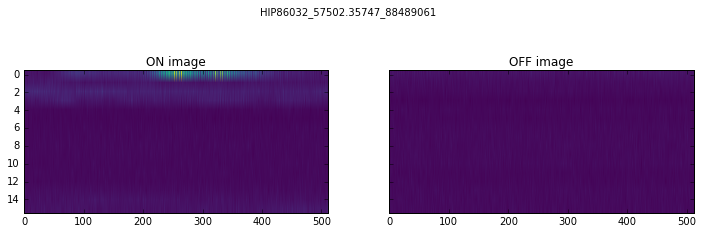

index: 1


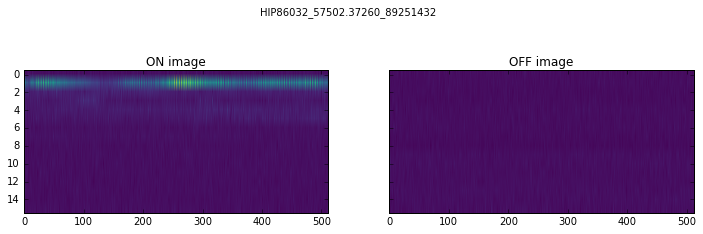

index: 2


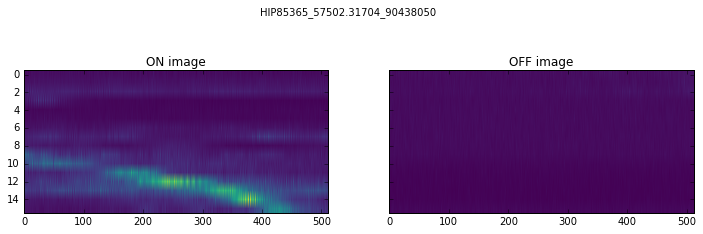

index: 3


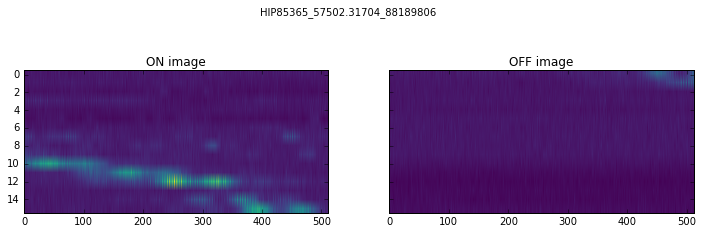

index: 4


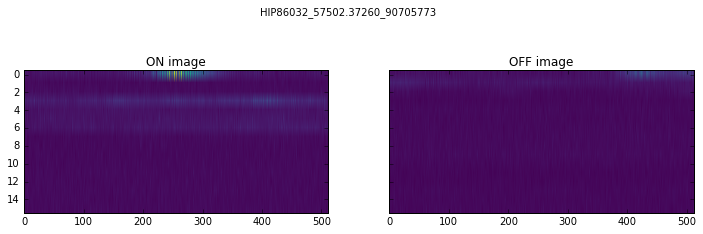

index: 5


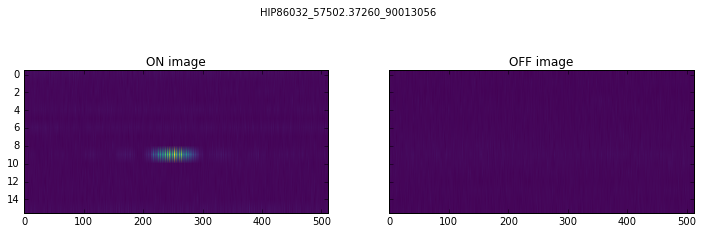

index: 6


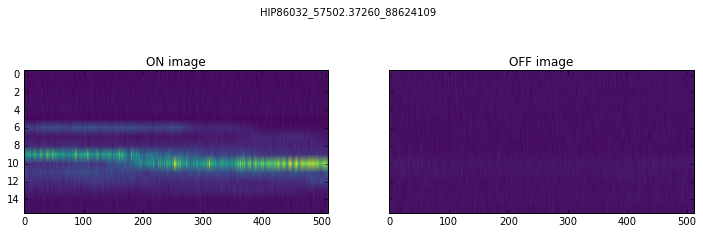

index: 7


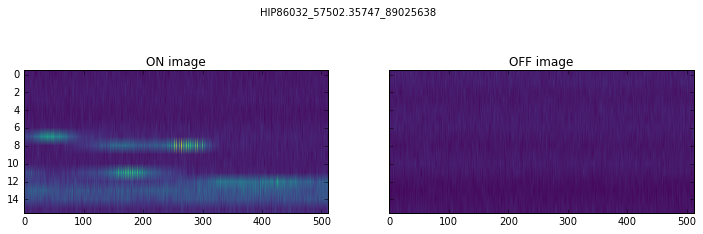

index: 8


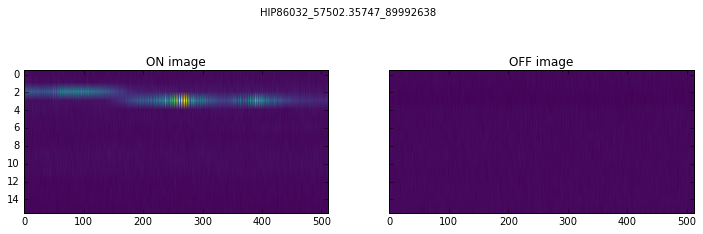

index: 9


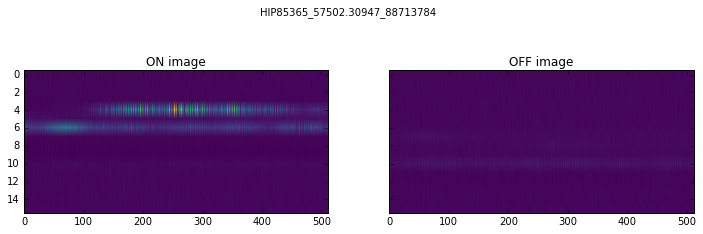

index: 10


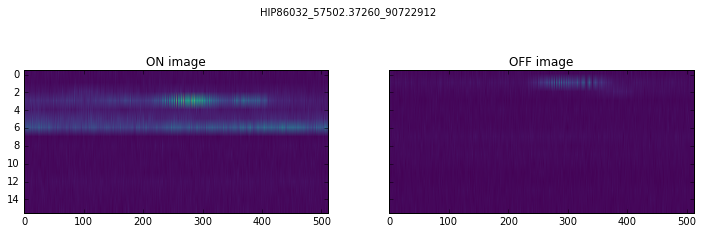

index: 11


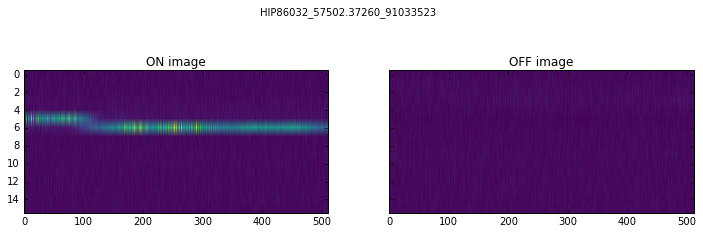

index: 12


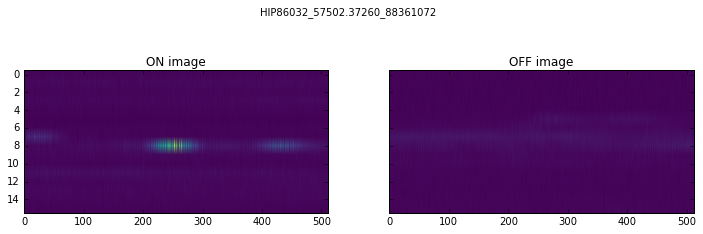

index: 13


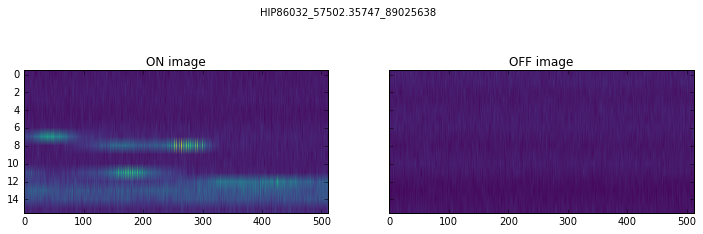

index: 14


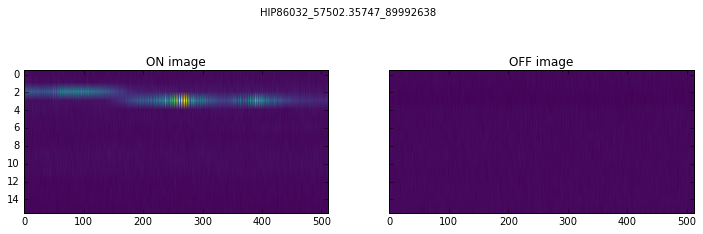

index: 15


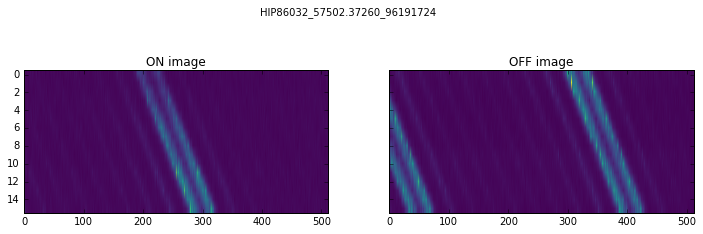

index: 16


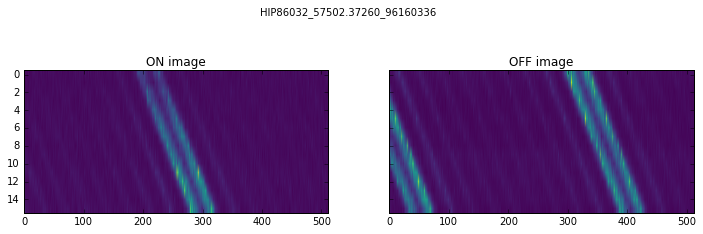

index: 17


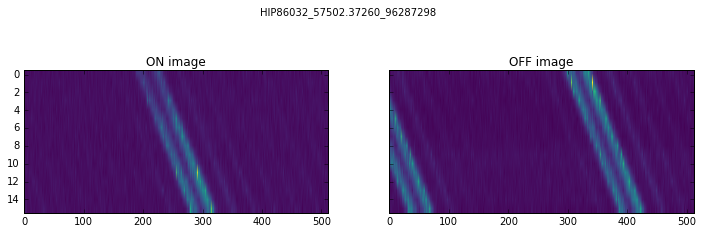

index: 18


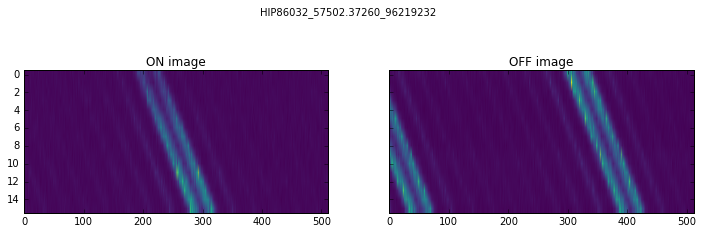

index: 19


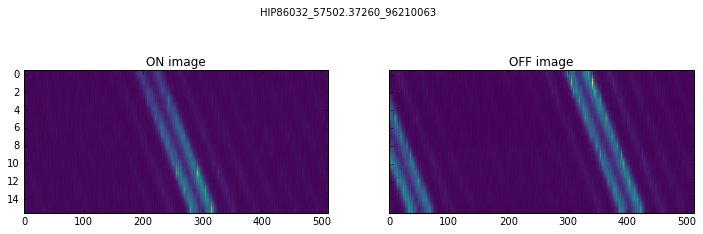

index: 20


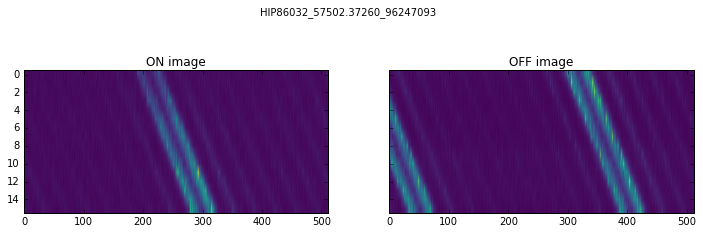

index: 21


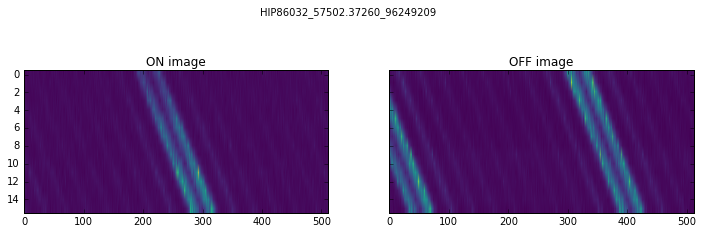

index: 22


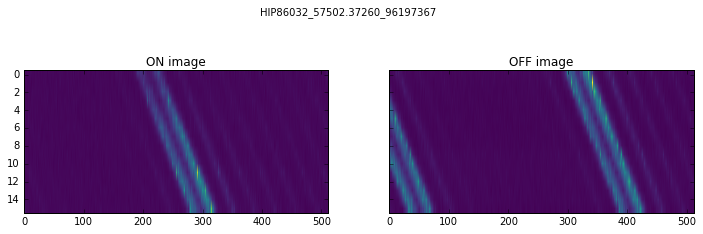

index: 23


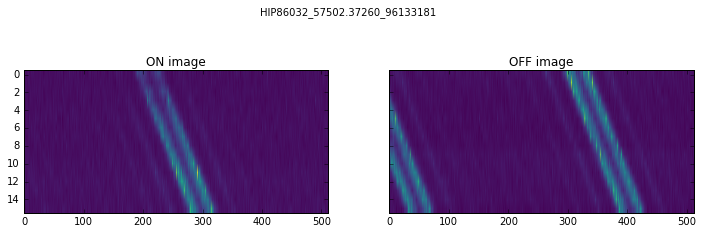

index: 24


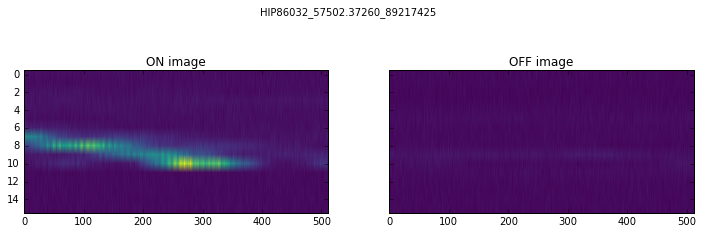

index: 25


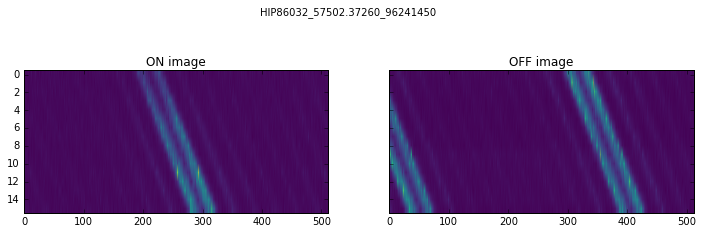

index: 26


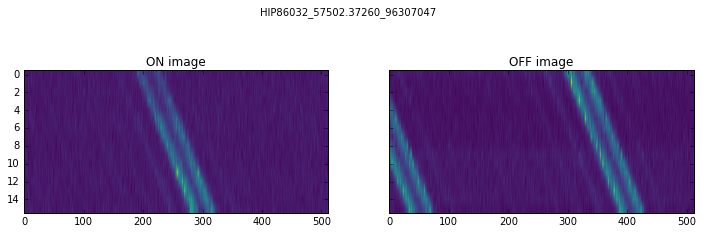

index: 27


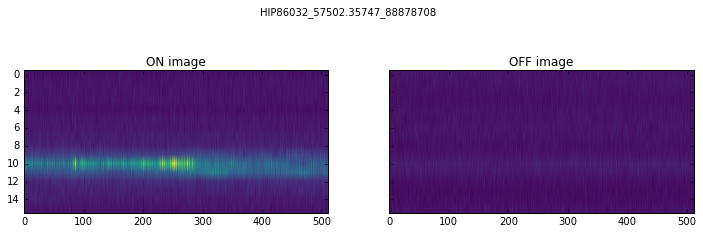

index: 28


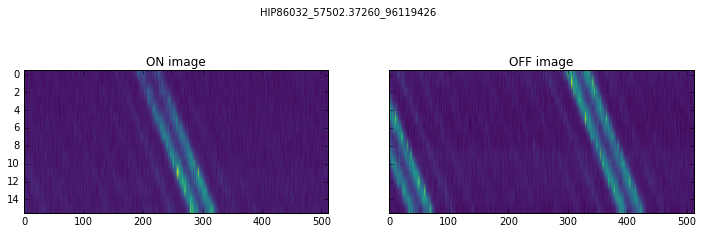

index: 29


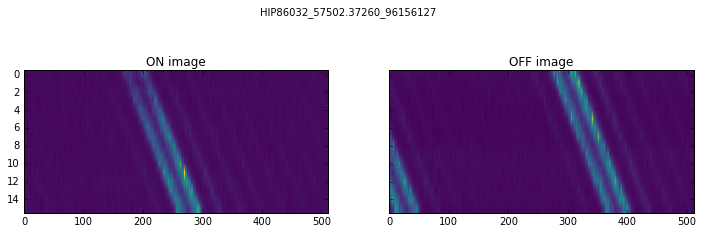

index: 30


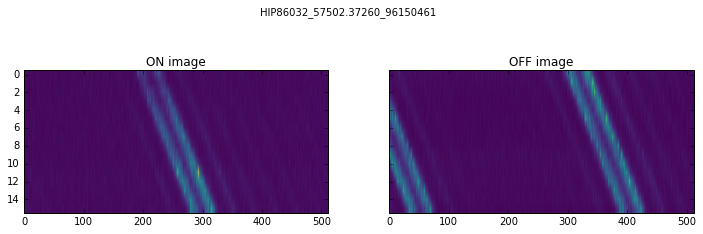

index: 31


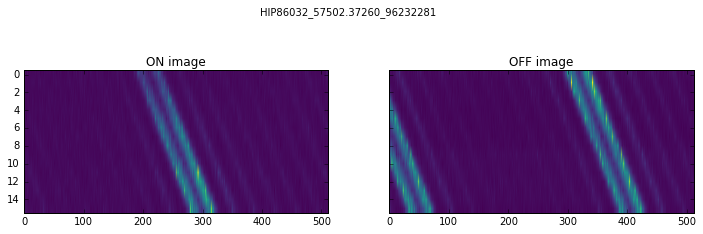

index: 32


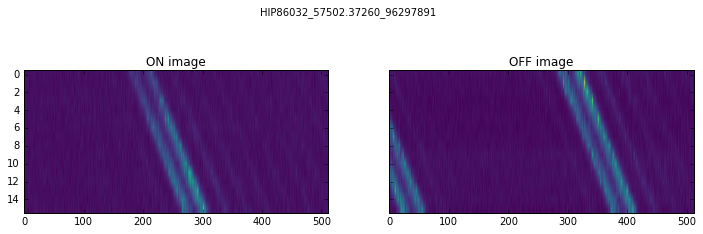

index: 33


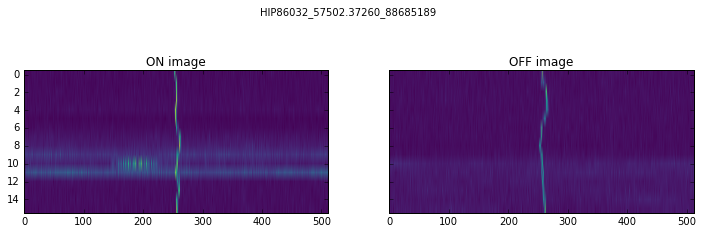

index: 34


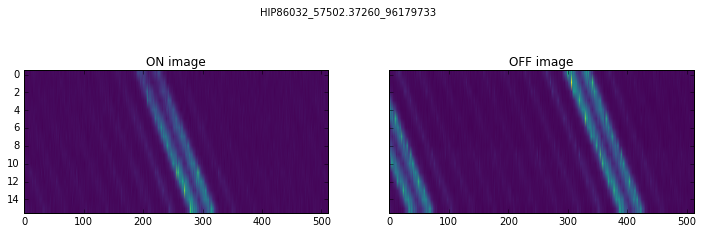

index: 35


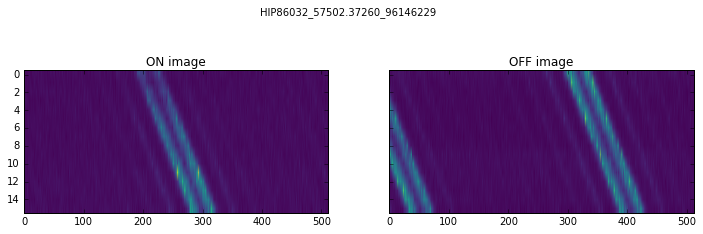

index: 36


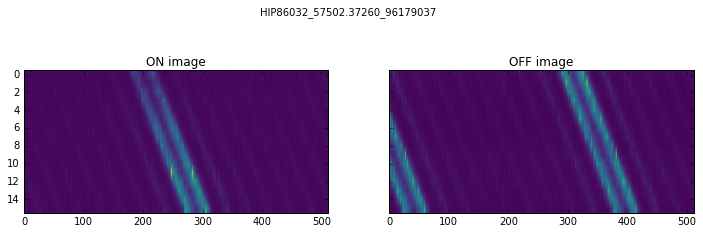

index: 37


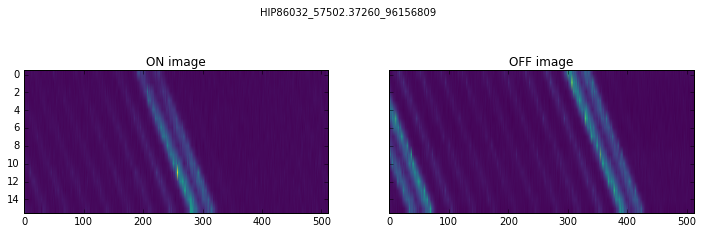

index: 38


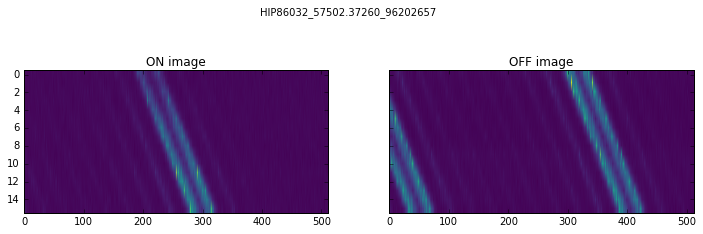

index: 39


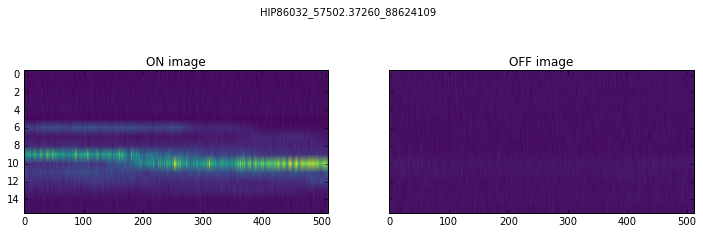

index: 40


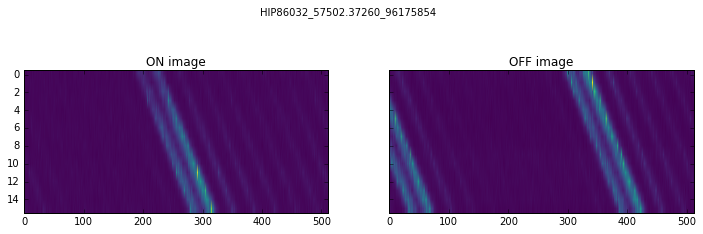

index: 41


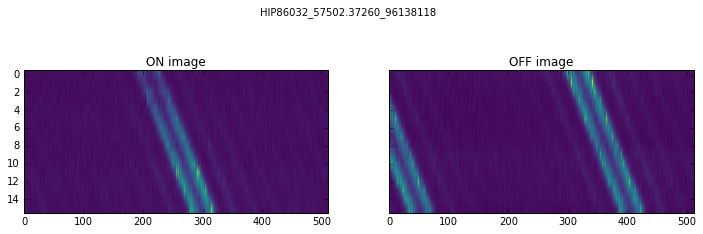

index: 42


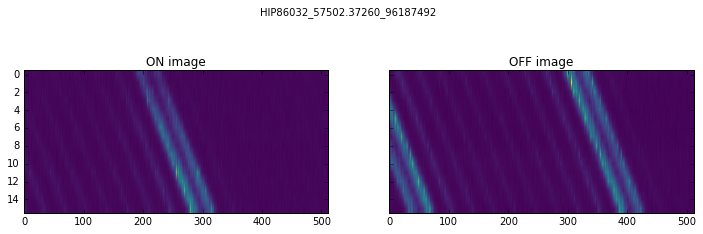

index: 43


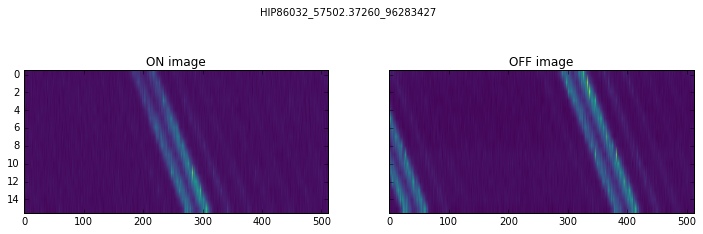

index: 44


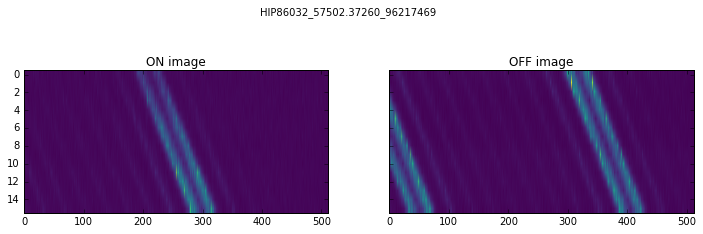

index: 45


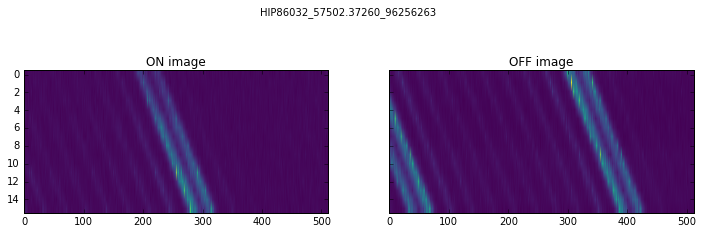

index: 46


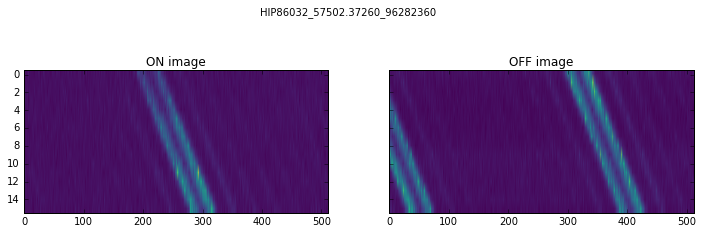

index: 47


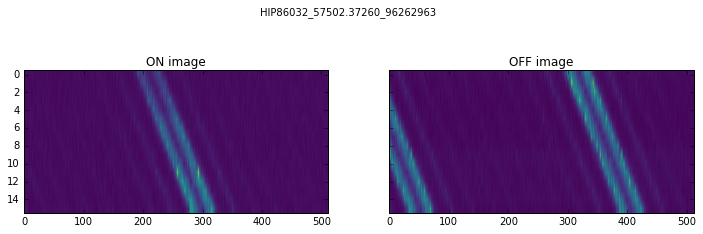

index: 48


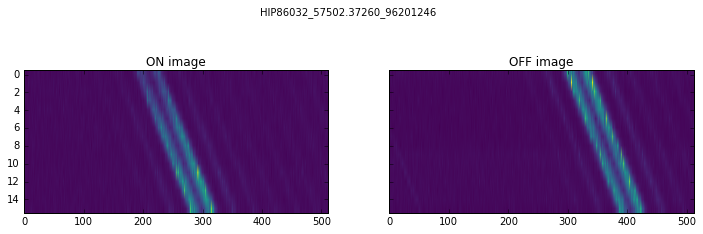

index: 49


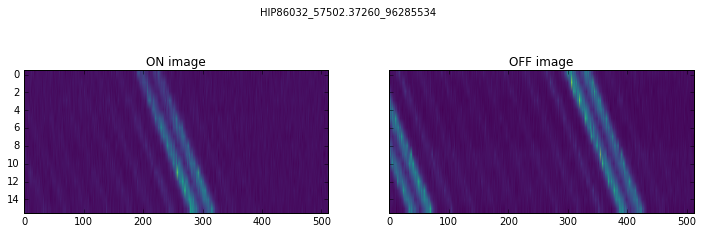

index: 50


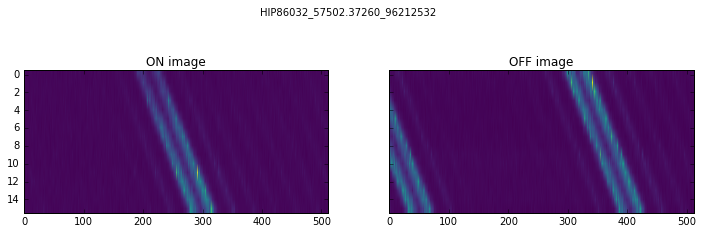

index: 51


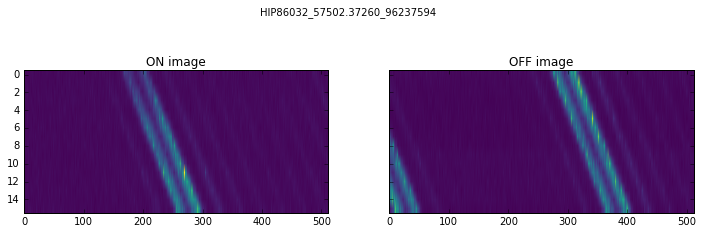

index: 52


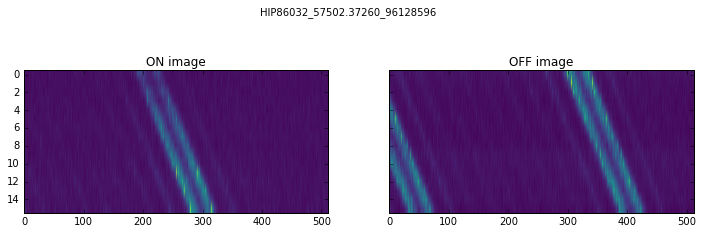

index: 53


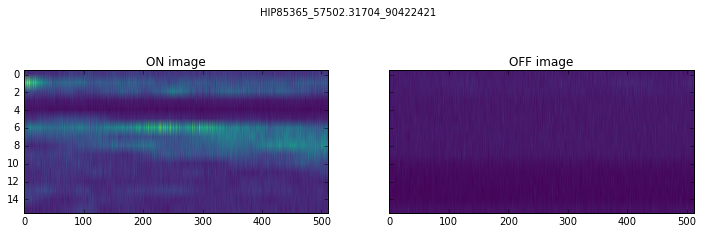

index: 54


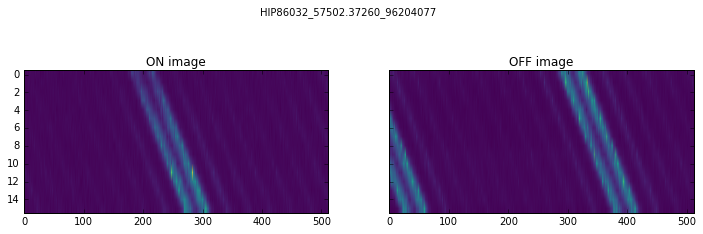

index: 55


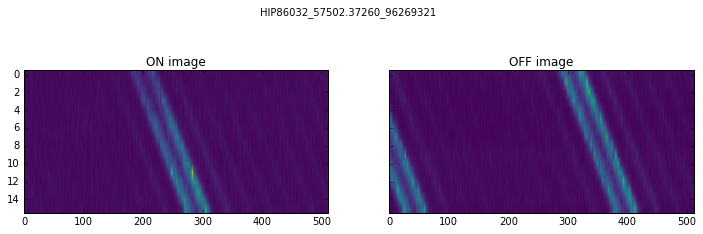

index: 56


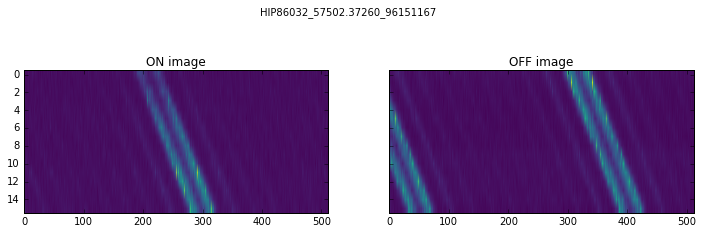

index: 57


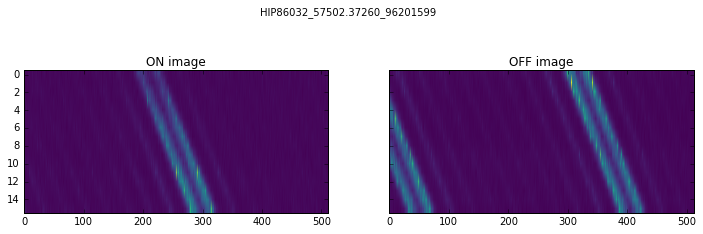

index: 58


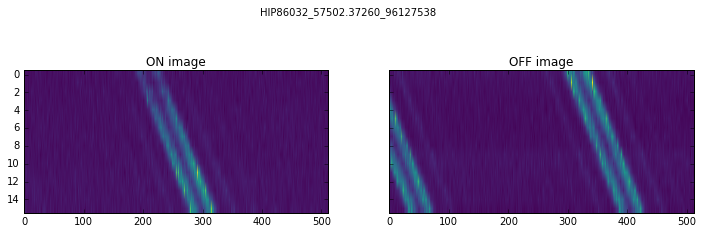

index: 59


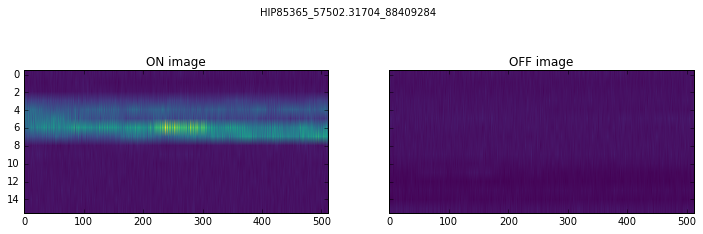

index: 60


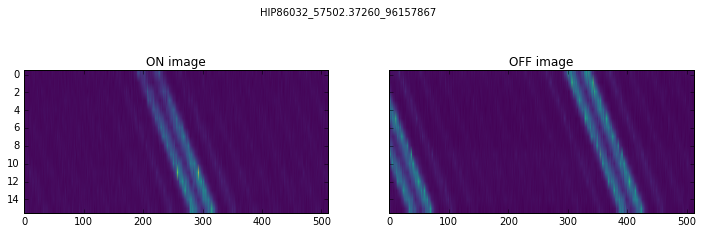

index: 61


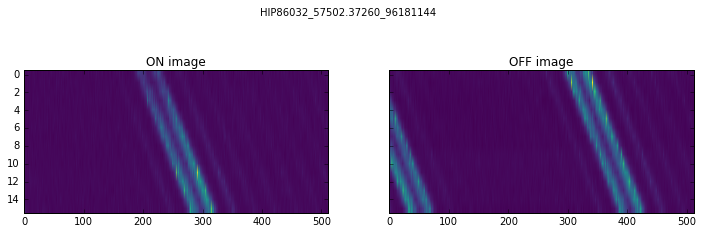

index: 62


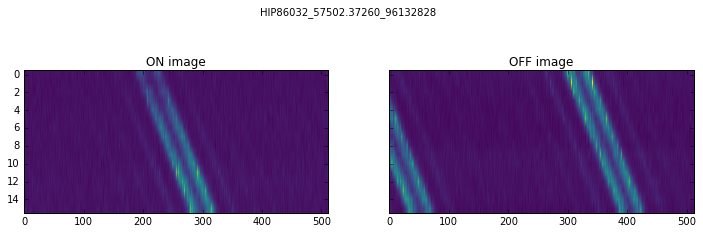

In [56]:
for a, x in enumerate(wrong_label):
    print("index: " + str(a))
    plot_name(x)

index: 0


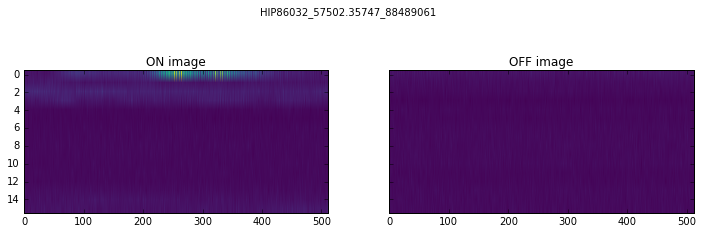

index: 1


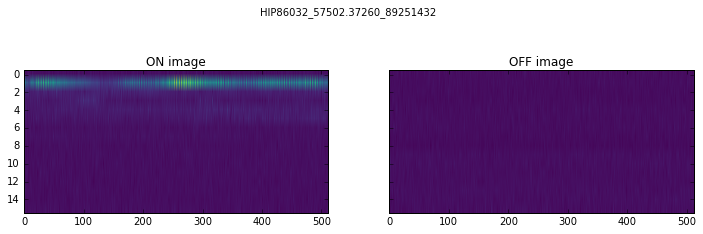

index: 2


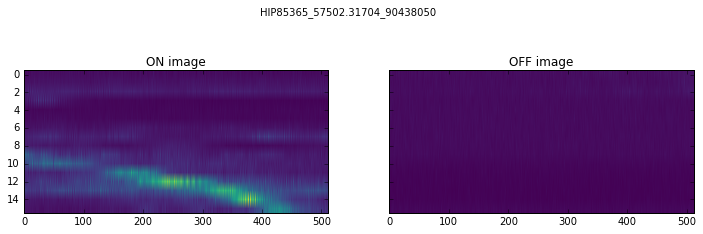

index: 3


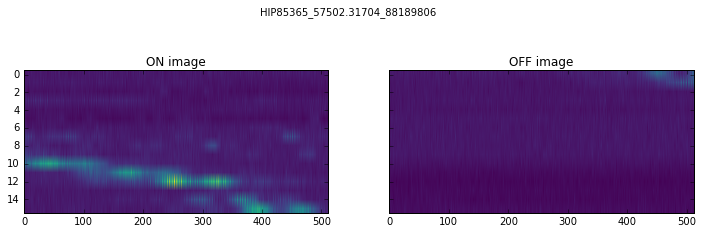

index: 4


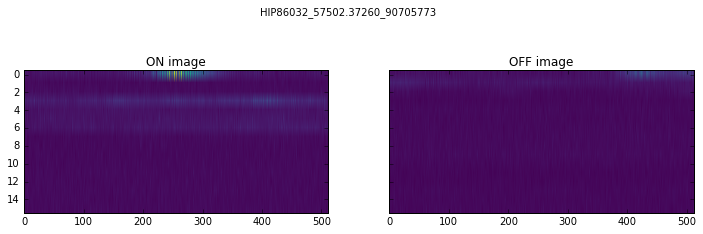

index: 5


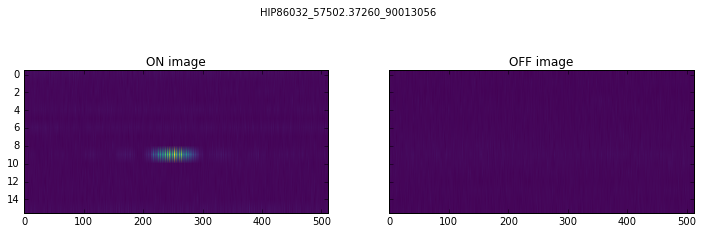

index: 6


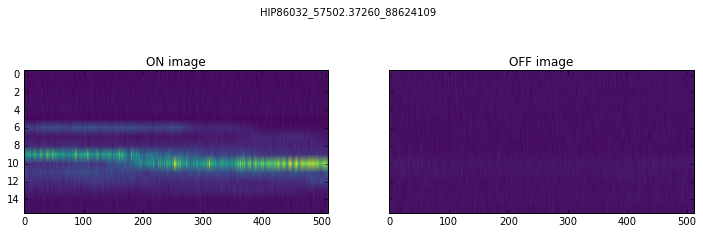

index: 7


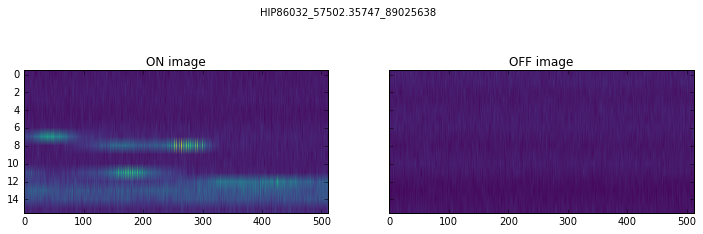

index: 8


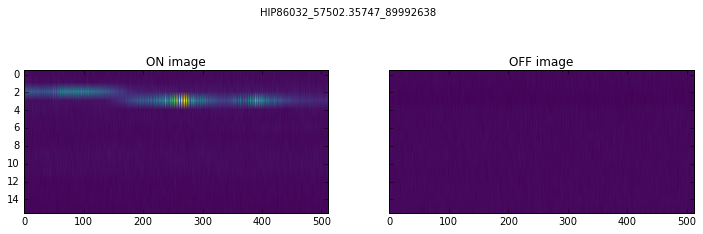

index: 9


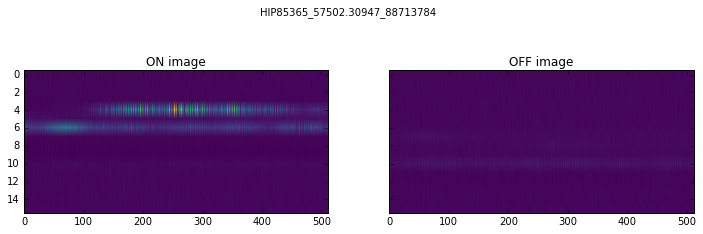

index: 10


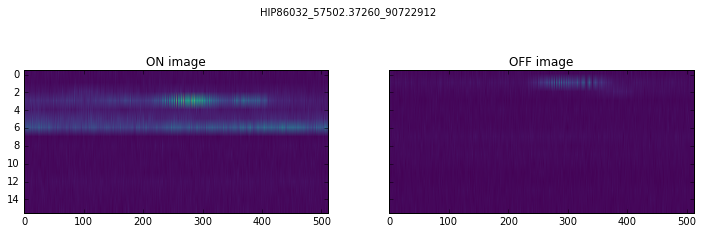

index: 11


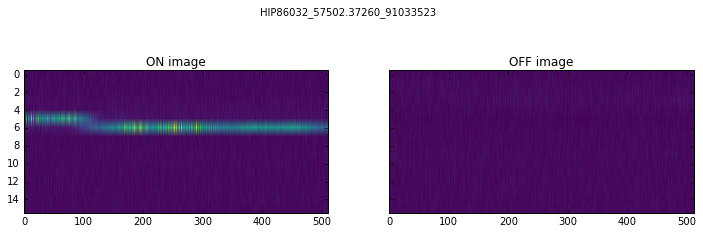

index: 12


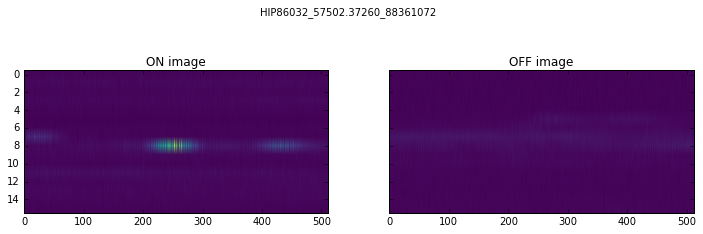

index: 13


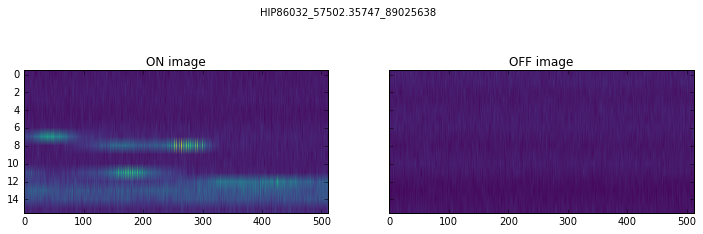

index: 14


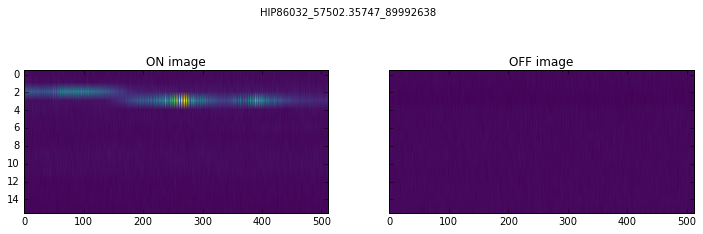

index: 15


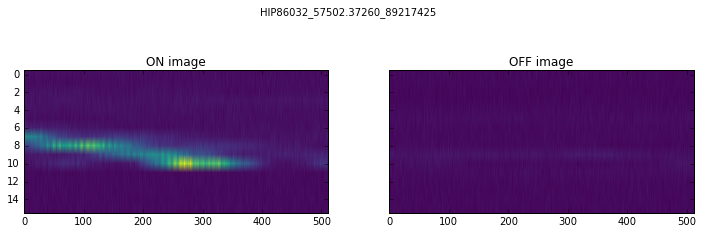

index: 16


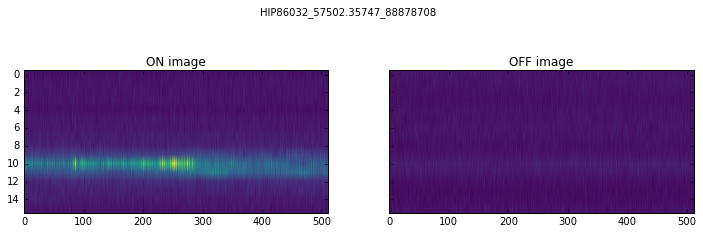

index: 17


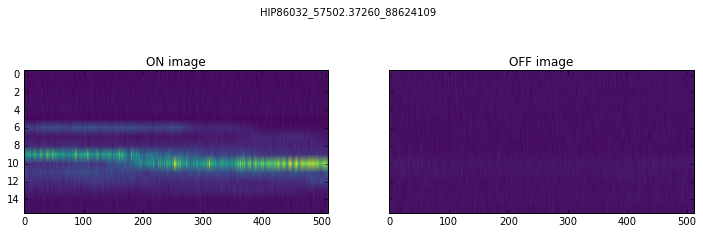

index: 18


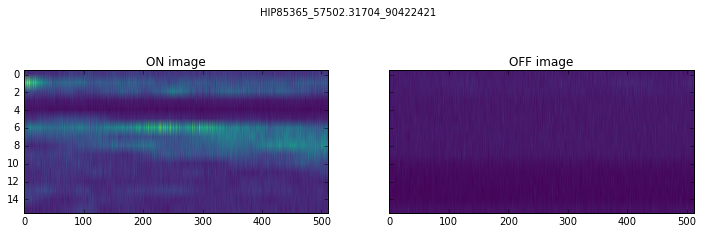

index: 19


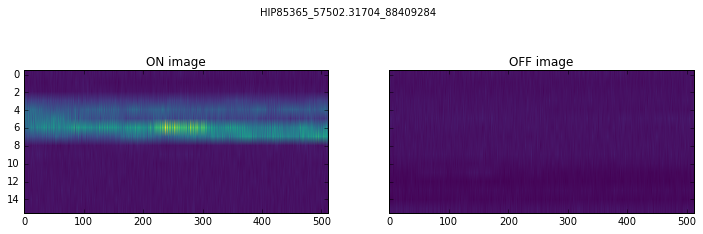

In [57]:
wrong_label = [v for i,v in enumerate(wrong_label) if i not in
               frozenset((15, 16, 17, 18, 19, 20, 21, 22, 23,
                         25, 26, 28, 29, 30, 31, 32, 33, 34, 35,
                         36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47,
                         48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 60,
                         61, 62))] 
for a, x in enumerate(wrong_label):
    print("index: " + str(a))
    plot_name(x)

## <font color='blue'> Full Set</font>
### Get Signals

In [19]:
all_GPS_signals = df.loc[df['GPS'] == -1]
all_unlabelled_signals = df.loc[df['GPS'] == 1]

del all_GPS_signals['GPS']
del all_unlabelled_signals['GPS']

In [20]:
all_GPS_names = all_GPS_signals.index.tolist()
all_GPS_dict = all_GPS_signals.T.to_dict()
all_GPS_featuresets = [all_GPS_dict[x] for x in all_GPS_names]

all_unlabelled_names = all_unlabelled_signals.index.tolist()
all_unlabelled_dict = all_unlabelled_signals.T.to_dict()
all_unlabeled_featuresets = [all_unlabelled_dict[x] for x in all_unlabelled_names]

### Train a Classifier

In [58]:
classifier = PositiveNaiveBayesClassifier.train(all_GPS_featuresets,
                                                 all_unlabeled_featuresets,
                                                positive_prob_prior = 0.0005)


In [65]:
for x in range(len(all_unlabeled_featuresets)):
    if classifier.classify(all_unlabeled_featuresets[x]):
        error.append(all_unlabelled_names[x])
print(len(error))

22


index: 0


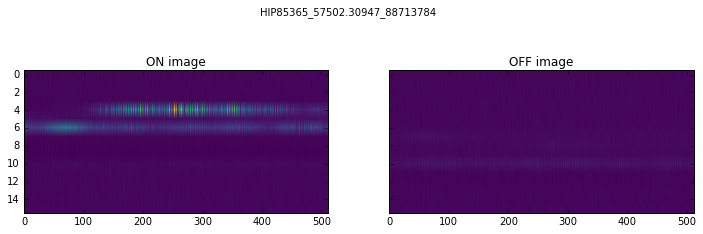

index: 1


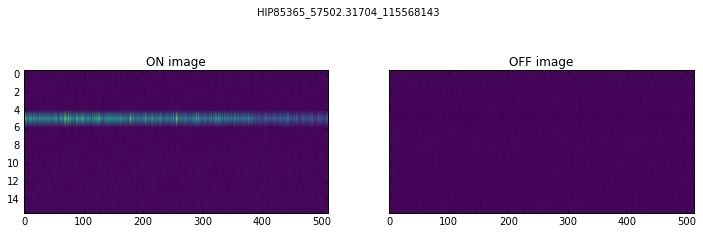

index: 2


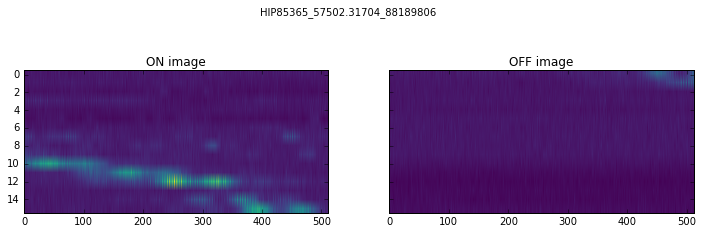

index: 3


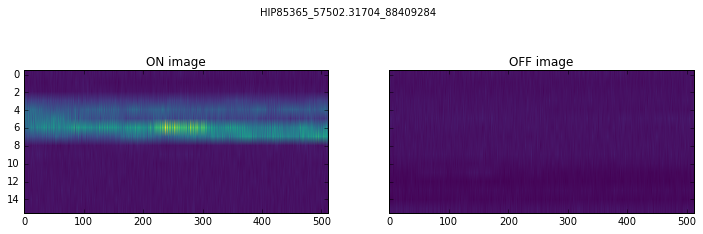

index: 4


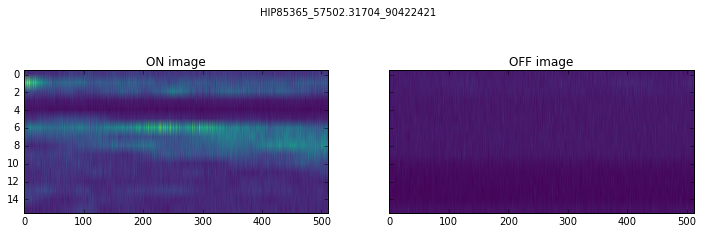

index: 5


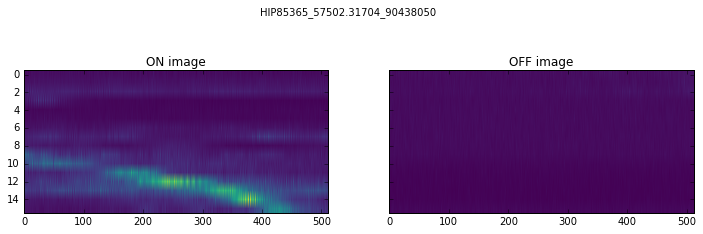

index: 6


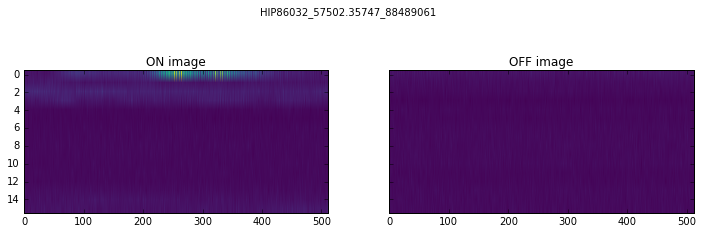

index: 7


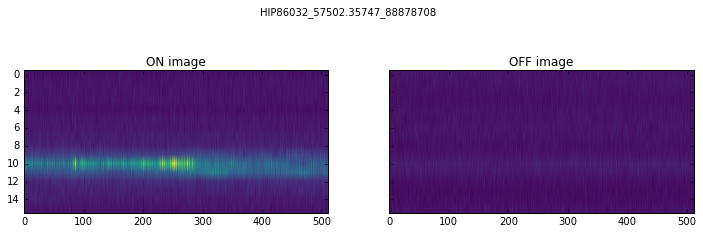

index: 8


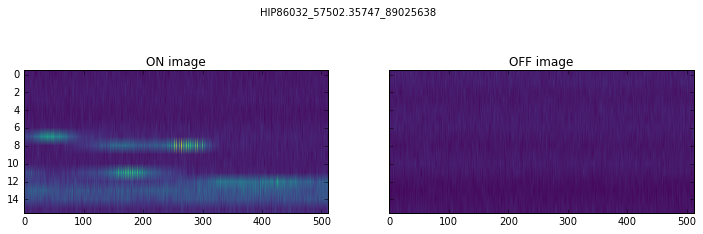

index: 9


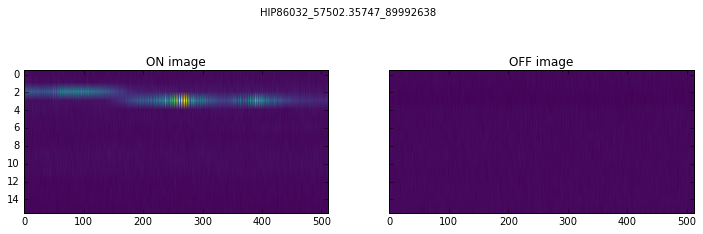

index: 10


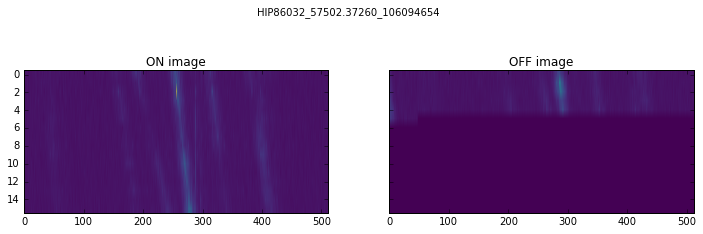

index: 11


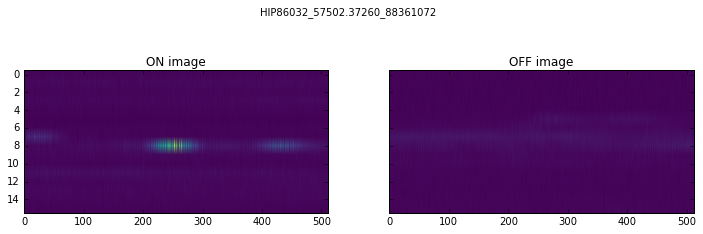

index: 12


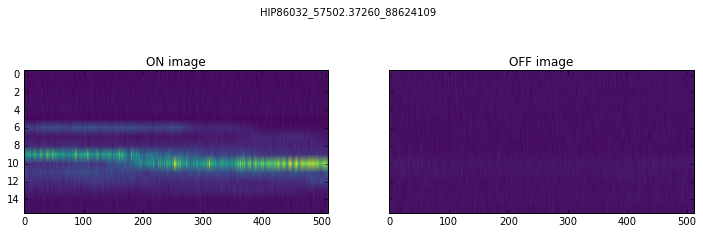

index: 13


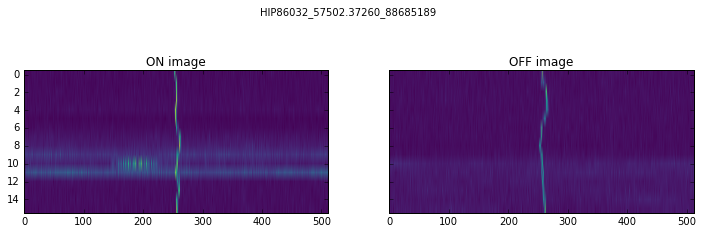

index: 14


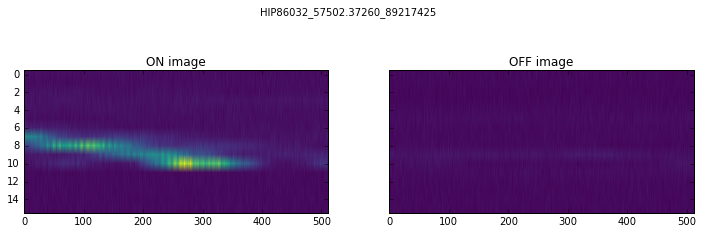

index: 15


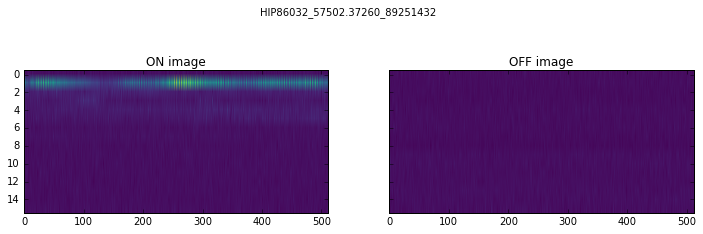

index: 16


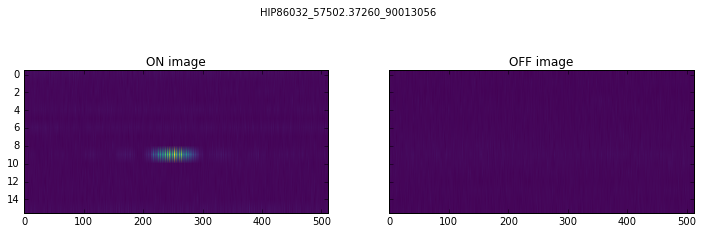

index: 17


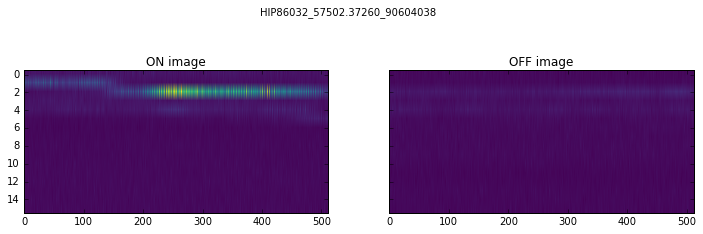

index: 18


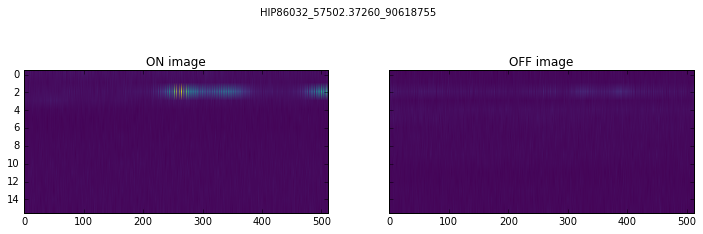

index: 19


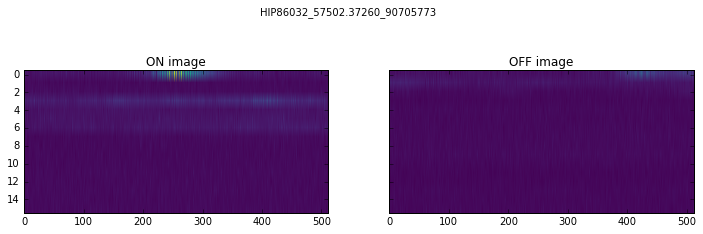

index: 20


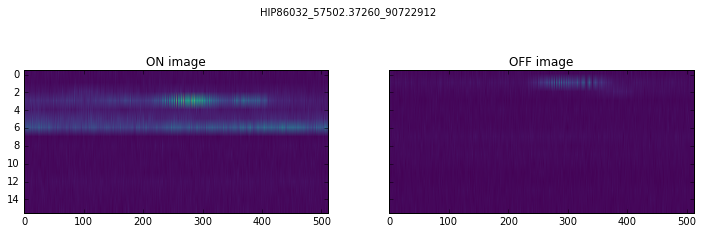

index: 21


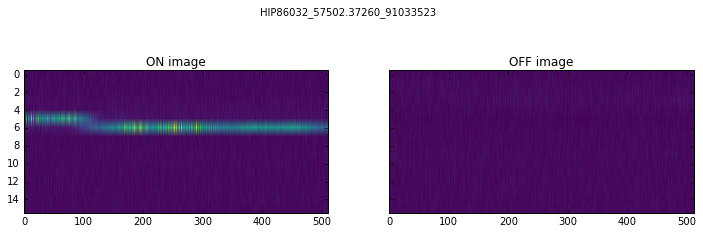

In [61]:
for a, x in enumerate(error):
    print("index: " + str(a))
    plot_name(x)

index: 0


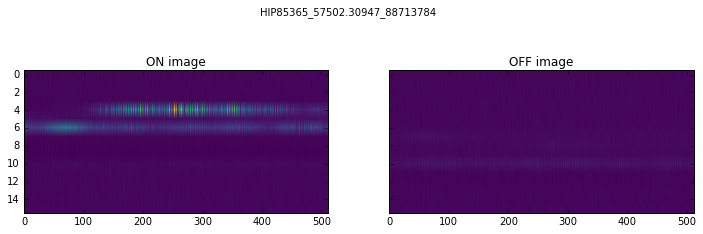

index: 1


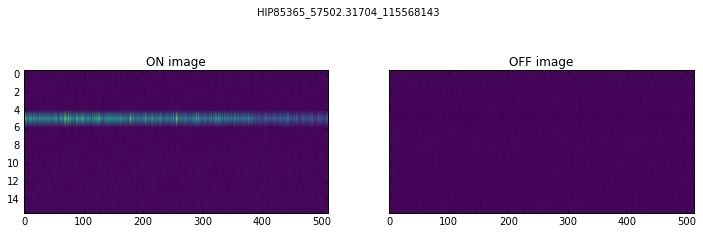

index: 2


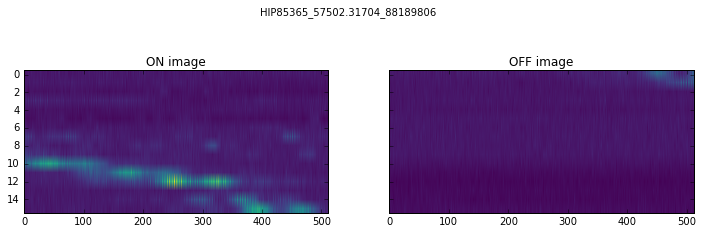

index: 3


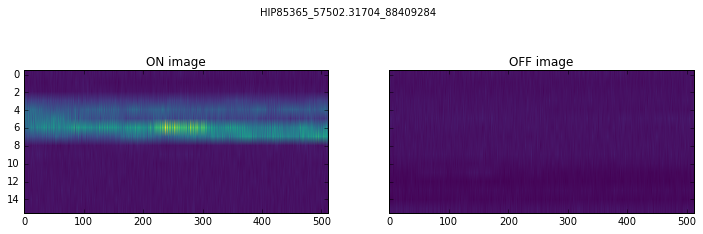

index: 4


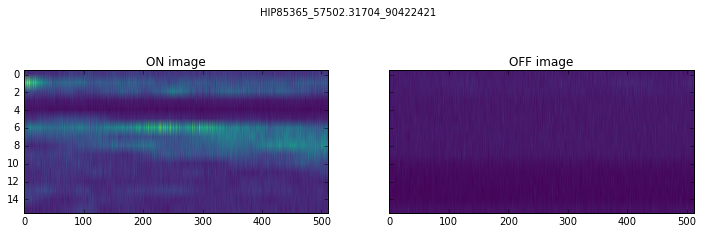

index: 5


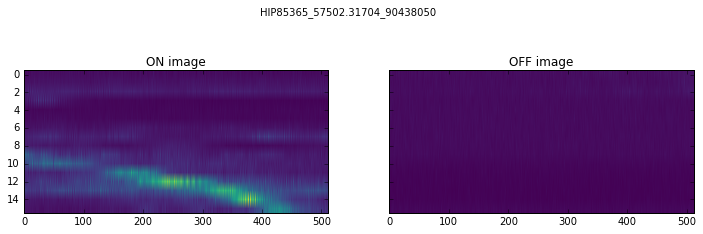

index: 6


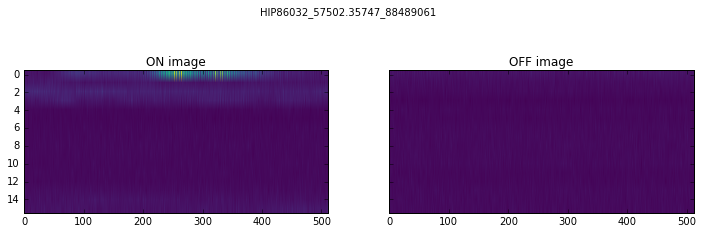

index: 7


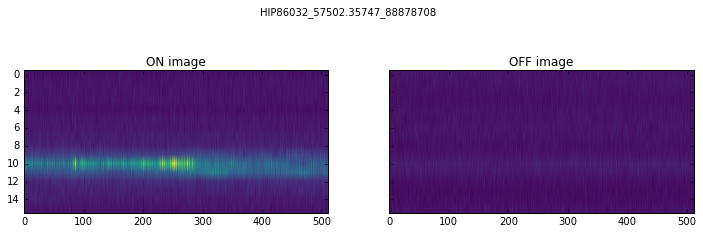

index: 8


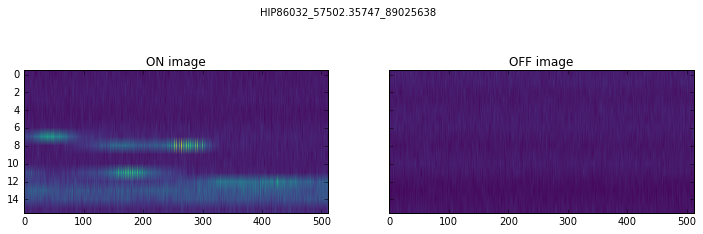

index: 9


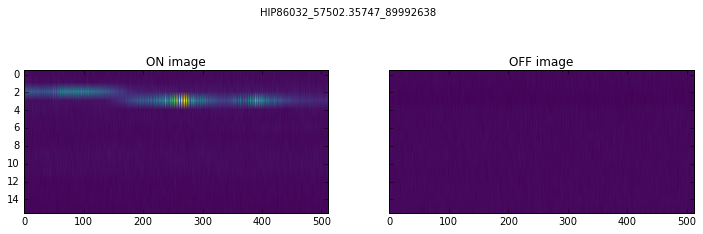

index: 10


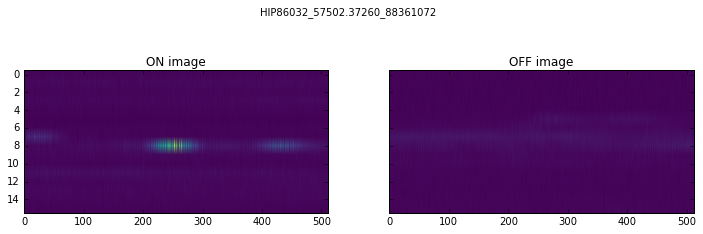

index: 11


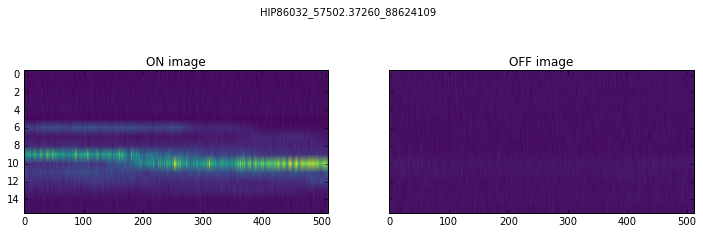

index: 12


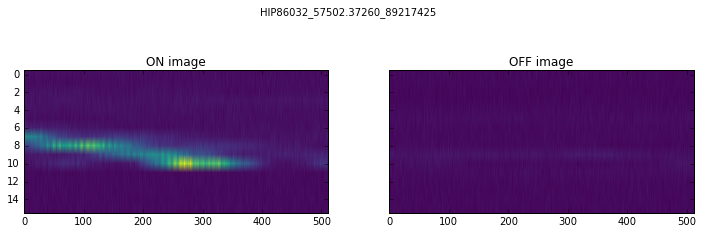

index: 13


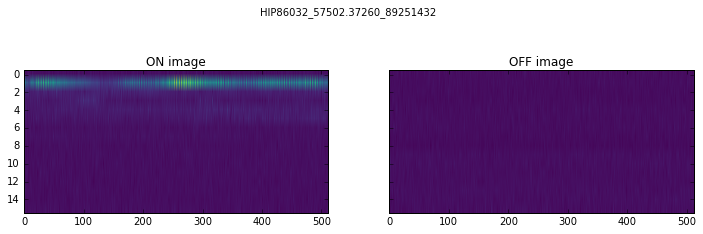

index: 14


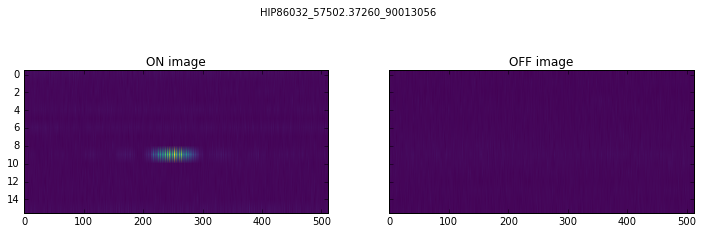

index: 15


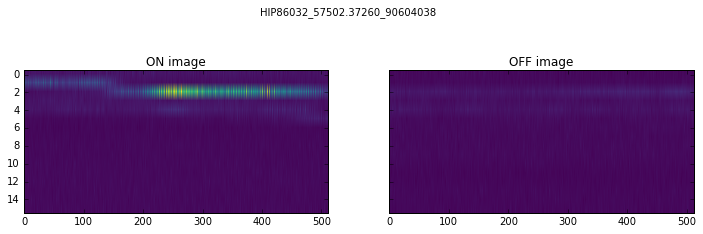

index: 16


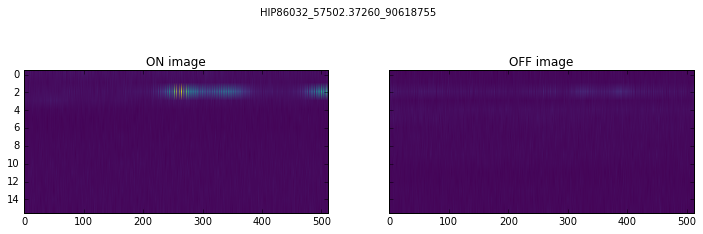

index: 17


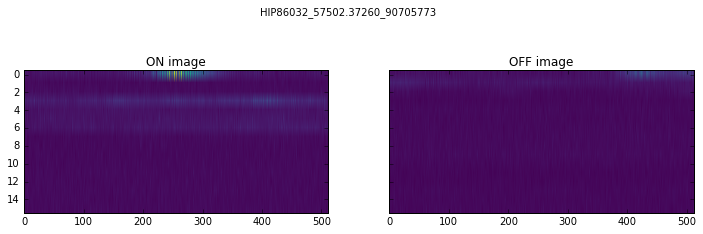

index: 18


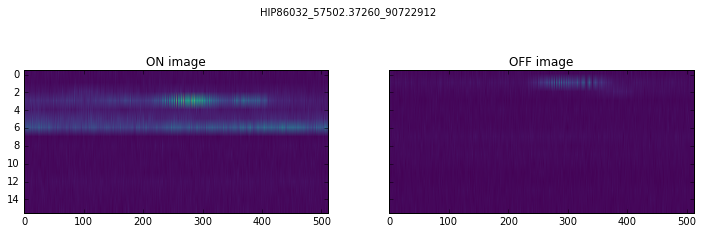

index: 19


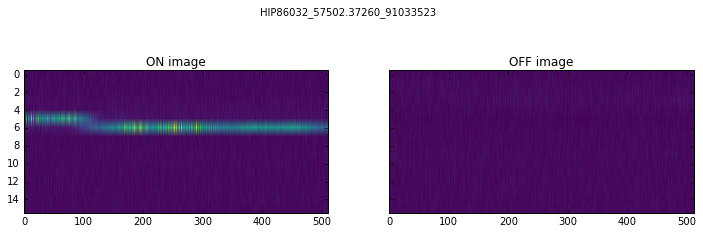

In [66]:
error = [v for i,v in enumerate(error) if i not in frozenset((10, 13))] 
for a, x in enumerate(error):
    print("index: " + str(a))
    plot_name(x)

### Compare all of supposedly wrongly labelled points when trained seperately on the train/validation/test with training it on the full set all at once.

In [68]:
print(len(wrong_label))
print(len(error))
# They do the same things.

20
20


### Since they do the same things, I figured I'd just use my original trained classifier.

## Confirm results on validation set.

In [73]:
all_validate = validate_GPS_featuresets + validate_unlabeled_featuresets
all_validate_names = validate_GPS_names + validate_unlabelled_names

9448
9448


In [77]:
print("Labelled data originally had " + str(len(validate_GPS_names)) + " GPS signals.")
print("Labelled data originally had " + str(len(validate_unlabelled_names)) + " non-GPS signals.")

Labelled data originally had 137 GPS signals.
Labelled data originally had 9311 non-GPS signals.


In [78]:
notGPS = []
GPS = []

for x in range(len(all_validate)):
    if classifier.classify(all_validate[x]):
        GPS.append(all_validate_names[x])
    else:
        notGPS.append(all_validate_names[x])
print("Classifier classifies " + str(len(GPS)) + " GPS signals.")
print("Classifier classifies " + str(len(notGPS)) + " non-GPS signals.")

Classifier classifies 140 GPS signals.
Classifier classifies 9308 non-GPS signals.


In [104]:
unique_notGPS = list(set(validate_unlabelled_names) - set(notGPS))
unique_GPS = list(set(GPS) - set(validate_GPS_names))

print(len(unique_notGPS))
print(len(unique_GPS))

a = list(set(notGPS) - set(validate_unlabelled_names))
b = list(set(validate_GPS_names) - set(GPS))
print(a)
print(b)

3
3
[]
[]


These are plots originally labelled as NOT GPS but classified as GPS.


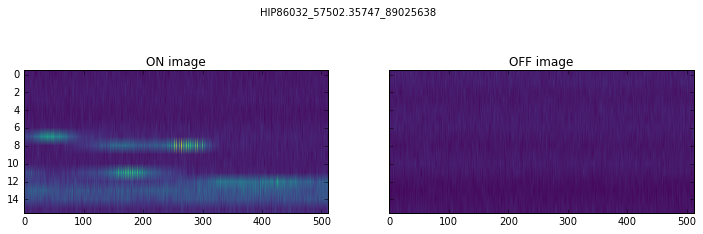

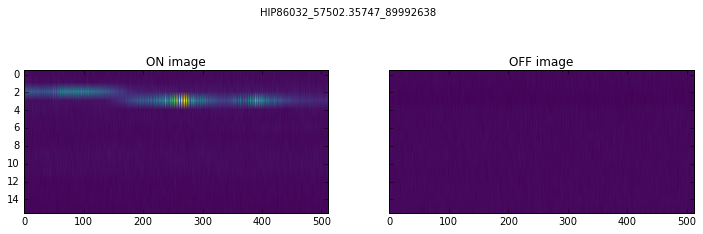

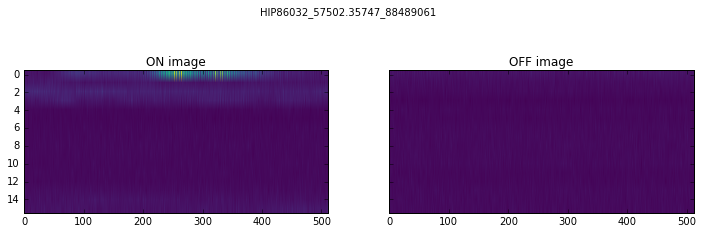

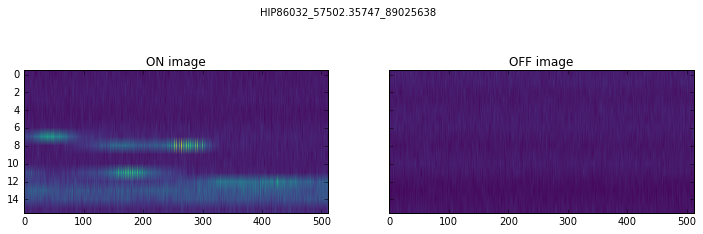

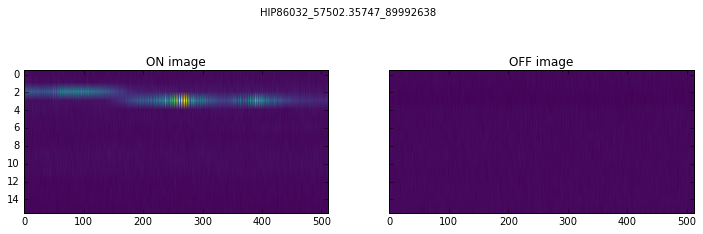

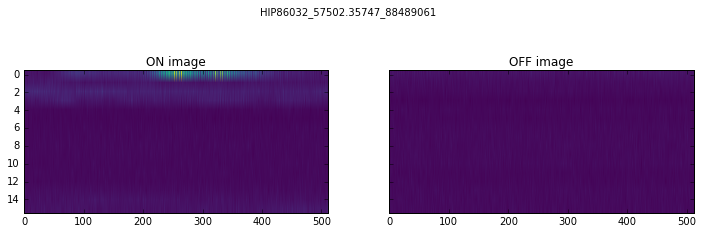

In [102]:
print("These are plots originally labelled as NOT GPS but classified as GPS.")
for x in unique_notGPS + unique_GPS:
    plot_name(x)

## Test Results on Test Set

In [89]:
all_test = test_GPS_featuresets + test_unlabeled_featuresets
all_test_names = test_GPS_names + test_unlabelled_names

In [93]:
print("Test data originally had " + str(len(test_GPS_names)) + " GPS signals.")
print("Test data originally had " + str(len(test_unlabelled_names)) + " non-GPS signals.")

Test data originally had 122 GPS signals.
Test data originally had 9327 non-GPS signals.


In [92]:
test_GPS = []
test_notGPS = []

for x in range(len(all_test)):
    if classifier.classify(all_test[x]):
        test_GPS.append(all_test_names[x])
    else:
        test_notGPS.append(all_test_names[x])
print("Classifier classifies " + str(len(test_GPS)) + " GPS signals.")
print("Classifier classifies " + str(len(test_notGPS)) + " non-GPS signals.")

Classifier classifies 128 GPS signals.
Classifier classifies 9321 non-GPS signals.


In [103]:
test_unique_notGPS = list(set(test_unlabelled_names) - set(test_notGPS))
test_unique_GPS = list(set(test_GPS) - set(test_GPS_names))

print(len(test_unique_notGPS))
print(len(test_unique_GPS))

a = list(set(test_notGPS) - set(test_unlabelled_names))
b = list(set(test_GPS_names) - set(test_GPS))
print(a)
print(b)

6
6
[]
[]


These are plots originally labelled as NOT GPS but classified as GPS.


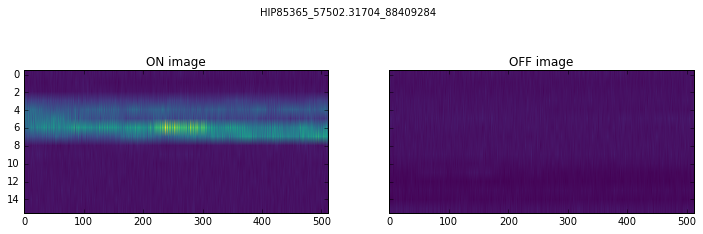

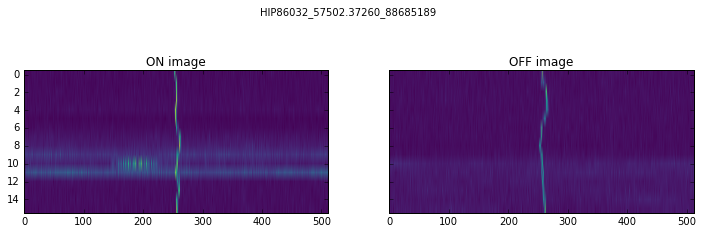

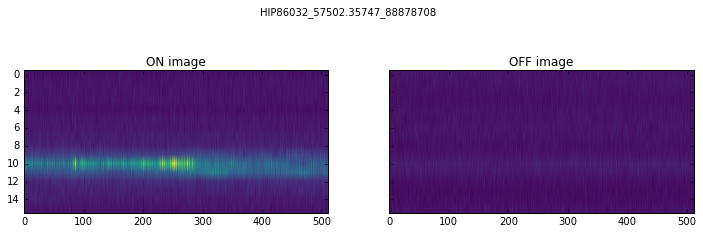

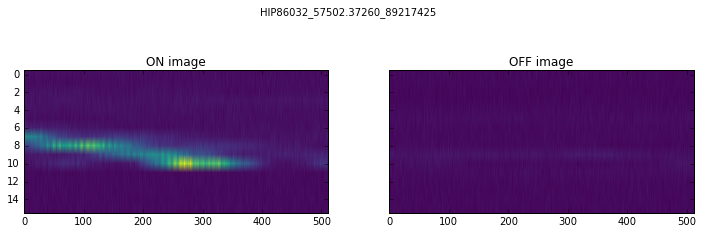

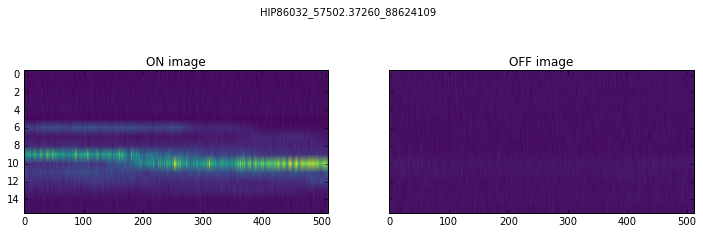

...

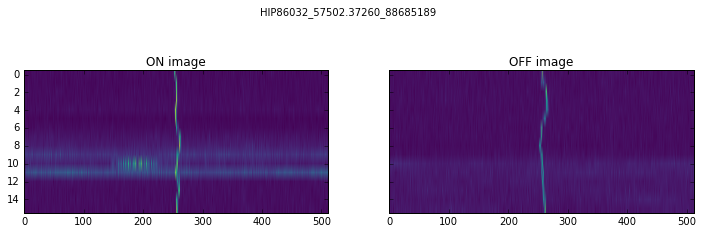

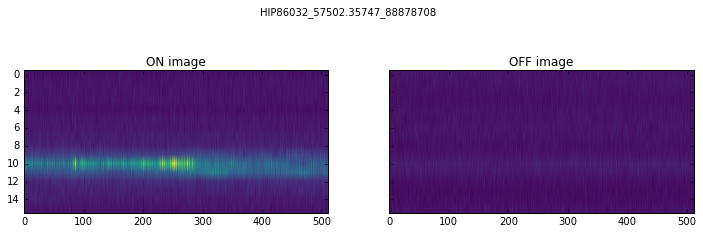

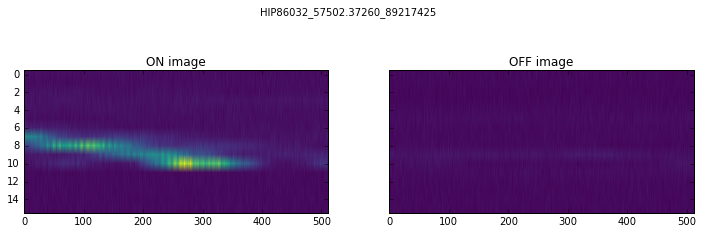

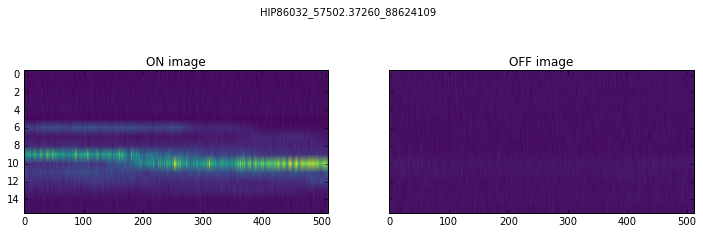

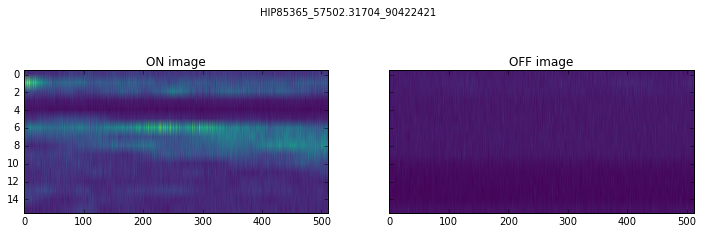

In [101]:
print("These are plots originally labelled as NOT GPS but classified as GPS.")
for x in test_unique_notGPS + test_unique_GPS:
    plot_name(x)

### Results on Validation + Test Set (exact same thing)

In [106]:
all_testval = test_GPS_featuresets + test_unlabeled_featuresets + validate_GPS_featuresets + validate_unlabeled_featuresets
all_testval_names = test_GPS_names + test_unlabelled_names + validate_GPS_names + validate_unlabelled_names

testval_GPS = []
testval_notGPS = []

for x in range(len(all_testval)):
    if classifier.classify(all_testval[x]):
        testval_GPS.append(all_testval_names[x])
    else:
        testval_notGPS.append(all_testval_names[x])
        
print("Classifier classifies " + str(len(testval_GPS)) + " GPS signals.")
print("Classifier classifies " + str(len(testval_notGPS)) + " non-GPS signals.")

Classifier classifies 268 GPS signals.
Classifier classifies 18629 non-GPS signals.


## Now I reclassify the data that seemed to be classified incorrectly.

In [138]:
all_GPS_e = targ0_no_OFF + targ1_no_OFF + targ2_no_OFF
all_GPS_e = all_GPS + error

In [139]:
df.loc[all_GPS_e, 'GPS'] = -1

In [142]:
with open('dataframe_GPS.pkl', 'wb') as outfile:
    pickle.dump(df, outfile, protocol=pickle.HIGHEST_PROTOCOL)

In [67]:
a = np.load('dataframe_GPS.pkl')
total = a.loc[a['GPS'] == -1]
print("Now we have " + str(total.shape[0]) + " signals such that it appears GPS-like in the ON, but has no OFF signal.")
print("This is " + str(687/47242 * 100) + " % of our total signals.")

Now we have 687 signals such that it appears GPS-like in the ON, but has no OFF signal.
This is 1.45421447017 % of our total signals.


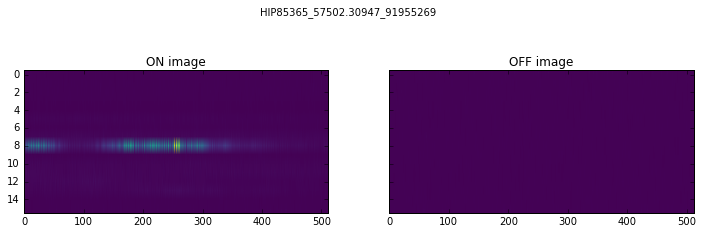

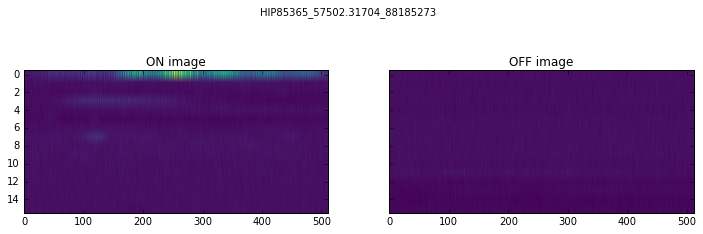

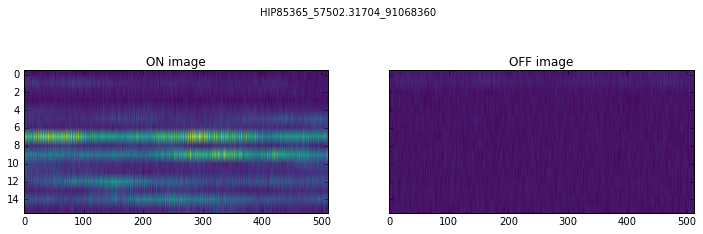

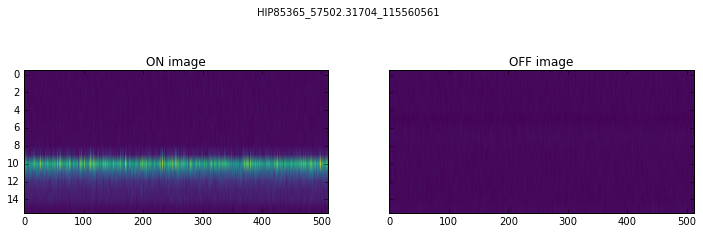

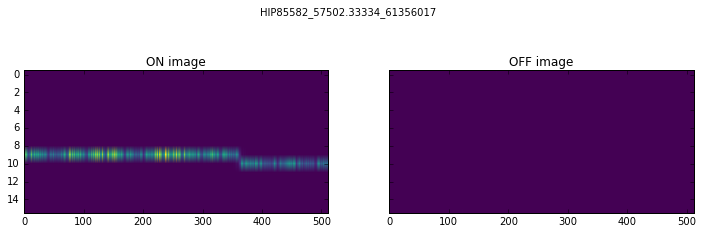

...

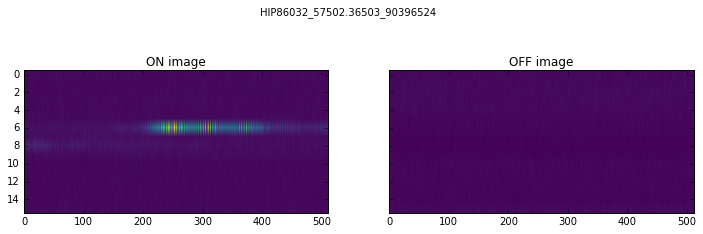

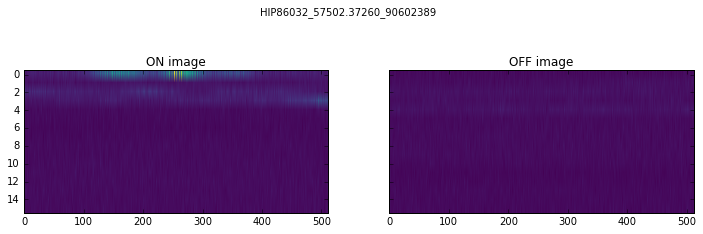

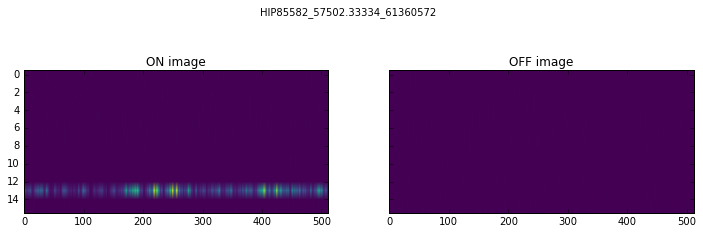

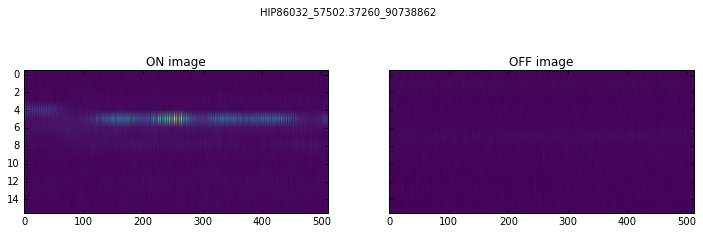

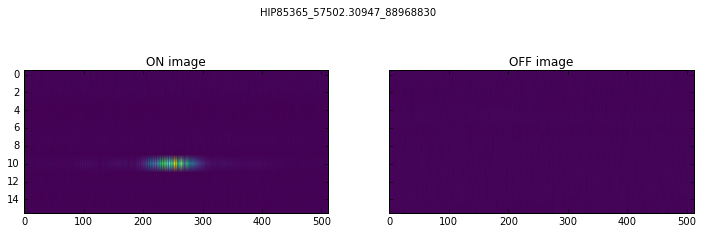

In [68]:
len(total.index.tolist())

for name in random.sample(total.index.tolist(), 20):
    plot_name(name)